# Multimodal


In [1]:
import pickle
import torch
import pandas as pd
import importlib
import utils
import models
import data_processing_utils

importlib.reload(data_processing_utils)
from data_processing_utils import *
importlib.reload(utils)
from utils import *
importlib.reload(models)
from models import *
from torch.utils.data import DataLoader, Subset
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [28]:
# If you want to use the csv.format
grouped_df = pd.read_csv('../data/haha-longer-longer-001.csv')

prepare the data

In [2]:
with open('../data/full_vocab_no_checkmate.pkl', 'rb') as inp:
    vocab = pickle.load(inp)

In [30]:
trainX_sequences, fens, trainX, trainY, vocab = df_to_data(grouped_df[:5000], vocab, sampling_rate=0.5, with_checkmate = False)
trainX_sequences, trainX_seqlengths  = pad_sequences(trainX_sequences)

In [63]:
filenames = [
    save_as_memmap(trainX_boards, '../data/1500/trainX_boards.memmap'),
    save_as_memmap(trainX_sequences, '../data/1500/trainX_sequences.memmap'),
    save_as_memmap(trainX_seqlengths, '../data/1500/trainX_seqlengths.memmap'),
    save_as_memmap(trainY, '../data/1500/trainY.memmap'),
]

In [62]:
df = pd.DataFrame(fens, columns=['fens'])
csv_filename = './../data/1500/fens.csv'
df.to_csv(csv_filename, index=False)

In [3]:
# For trainX
dtype_trainX = np.bool_  # or the correct dtype for your data
shape_trainX = (28831764, 17,8,8)  # replace with the correct shape
trainX = load_memmap('./../data/1500/larger-1+2/trainX_boards.memmap', dtype_trainX, shape_trainX)

# For trainY
dtype_trainY = np.int64 # or the correct dtype for your data
shape_trainY = (28831764,)  # replace with the correct shape
trainY = load_memmap('./../data/1500/larger-1+2/trainY.memmap', dtype_trainY, shape_trainY)

# For trainY
dtype_trainX_seqlengths = np.int64 # or the correct dtype for your data
shape_trainX_seqlengths = (28831764,)  # replace with the correct shape
trainX_seqlengths = load_memmap('./../data/1500/larger-1+2/trainX_seqlengths.memmap', dtype_trainX_seqlengths, shape_trainX_seqlengths)

# For trainY
dtype_trainX_sequences = np.int64 # or the correct dtype for your data
shape_trainX_sequences = (28831764, 16)  # replace with the correct shape
trainX_sequences = load_memmap('./../data/1500/larger-1+2/trainX_sequences.memmap', dtype_trainX_sequences, shape_trainX_sequences)

fens = pd.read_csv('../data/1500/larger-1+2/fens.csv')['fens']


Functions for training

In [41]:
def train(device, model, train_loader, val_loader, criterion, optimizer, num_epochs, learn_decay):
    train_loss_values = []
    train_error = []
    val_loss_values = []
    val_error = []
    val_3_accuracy = []
    for epoch in range(num_epochs):
        train_correct = 0
        train_total = 0
        training_loss = 0.0
        # Training
        model.train()
        count = 0
        for boards, sequences, lengths, labels in train_loader:
            count += 1
            boards, sequences, lengths, labels = boards.to(device, non_blocking=True), sequences.to(device, non_blocking=True), lengths, labels.to(device, non_blocking=True)
            # Forward Pass
            output = model(boards, sequences, lengths)
            loss = criterion(output, labels)
            # Backpropogate & Optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            # For logging purposes
            training_loss += loss.item()
            _, predicted = torch.max(output.data, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()
            if count % 1000 == 0:
                print(f'Epoch {epoch+1}, Batch: {count}| Training Loss: {training_loss/count}')
        # Validation
        model.eval()
        val_correct = 0
        val_total = 0
        validation_loss = 0.0
        if val_loader is not None:
            with torch.no_grad():
                val_correct = 0
                val_total = 0
                val_top3_correct = 0
                validation_loss = 0

                for boards, sequences, lengths, labels in val_loader:
                    boards, sequences, lengths, labels = boards.to(device, non_blocking=True), sequences.to(device, non_blocking=True), lengths, labels.to(device, non_blocking=True)
                    outputs = model(boards, sequences, lengths)
                    _, predicted = torch.max(outputs.data, 1)
                    val_total += labels.size(0)
                    val_correct += (predicted == labels).sum().item()
                    val_top3_correct += top_3_accuracy(labels, outputs) * labels.size(0)
                    loss = criterion(outputs, labels)
                    validation_loss += loss.item()

                val_loss_values.append(validation_loss / len(val_loader))
                val_accuracy = 100 * val_correct / val_total
                val_top3_accuracy = 100 * val_top3_correct / val_total
                val_error.append(100 - val_accuracy)
                val_3_accuracy.append(val_top3_accuracy)

        # Log Model Performance  
        train_loss_values.append(training_loss)
        train_error.append(100-100*train_correct/train_total)
        print(f'Epoch {epoch+1}, Training Loss: {training_loss/len(train_loader)}, Validation Error: {val_error[-1]}, Validation Top-3 Accuracy: {val_3_accuracy[-1]}, Training Error: {train_error[-1]}')
        if epoch <= 10:
            for op_params in optimizer.param_groups:
                op_params['lr'] = op_params['lr'] * learn_decay
    return train_error,train_loss_values, val_error, val_loss_values

def train_with_fen(device, model, train_loader, val_loader, criterion, optimizer, num_epochs, learn_decay):
    train_loss_values = []
    train_error = []
    val_loss_values = []
    val_error = []
    val_3_accuracy = []
    for epoch in range(num_epochs):
        train_correct = 0
        train_total = 0
        training_loss = 0.0
        # Training
        model.train()
        count = 0
        for boards, sequences, lengths, fens, labels in train_loader:
            count += 1
            boards, sequences, lengths, labels = boards.to(device, non_blocking=True), sequences.to(device, non_blocking=True), lengths, labels.to(device, non_blocking=True)
            # Forward Pass
            output = model(boards, sequences, lengths)
            loss = criterion(output, labels)
            # Backpropogate & Optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            # For logging purposes
            training_loss += loss.item()
            _, predicted = torch.max(output.data, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()
            if count % 1000 == 0:
                print(f'Epoch {epoch+1}, Batch: {count}| Training Loss: {training_loss/count}')
        # Validation
        model.eval()
        val_correct = 0
        val_total = 0
        validation_loss = 0.0
        if val_loader is not None:
            with torch.no_grad():
                val_correct = 0
                val_total = 0
                val_top3_correct = 0
                validation_loss = 0

                for boards, sequences, lengths, fens, labels in val_loader:
                    boards, sequences, lengths, labels = boards.to(device, non_blocking=True), sequences.to(device, non_blocking=True), lengths, labels.to(device, non_blocking=True)
                    outputs = model(boards, sequences, lengths)
                    _, predicted = torch.max(outputs.data, 1)
                    val_total += labels.size(0)
                    val_correct += (predicted == labels).sum().item()
                    val_top3_correct += top_3_accuracy(labels, outputs) * labels.size(0)
                    loss = criterion(outputs, labels)
                    validation_loss += loss.item()

                val_loss_values.append(validation_loss / len(val_loader))
                val_accuracy = 100 * val_correct / val_total
                val_top3_accuracy = 100 * val_top3_correct / val_total
                val_error.append(100 - val_accuracy)
                val_3_accuracy.append(val_top3_accuracy)

        # Log Model Performance  
        train_loss_values.append(training_loss)
        train_error.append(100-100*train_correct/train_total)
        print(f'Epoch {epoch+1}, Training Loss: {training_loss/len(train_loader)}, Validation Error: {val_error[-1]}, Validation Top-3 Accuracy: {val_3_accuracy[-1]}, Training Error: {train_error[-1]}')
        if epoch <= 10:
            for op_params in optimizer.param_groups:
                op_params['lr'] = op_params['lr'] * learn_decay
    return train_error,train_loss_values, val_error, val_loss_values


def train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, num_epochs, learn_decay):
    train_loss_values = []
    train_error = []
    val_loss_values = []
    val_error = []
    val_3_accuracy = []
    for epoch in range(num_epochs):
        train_correct = 0
        train_total = 0
        training_loss = 0.0
        # Training
        model.train()
        count = 0
        for boards, sequences, lengths, fens, labels in train_loader:
            count += 1
            boards, sequences, labels = boards.to(device, non_blocking=True), sequences.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            # Forward Pass
            output = model(boards, sequences)
            loss = criterion(output, labels)
            # Backpropogate & Optimize
            optimizer.zero_grad()
            loss.backward()
            
            torch.nn.utils.clip_grad_norm_(model.parameters(), 5)
            optimizer.step()
            # For logging purposes
            training_loss += loss.item()
            _, predicted = torch.max(output.data, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()
            if count % 1000 == 0:
                print(f'Epoch {epoch+1}, Batch: {count}| Training Loss: {training_loss/count} | Training Error: {train_correct/train_total}')
        # Validation
        model.eval()
        val_correct = 0
        val_total = 0
        validation_loss = 0.0
        if val_loader is not None:
            with torch.no_grad():
                val_correct = 0
                val_total = 0
                val_top3_correct = 0
                validation_loss = 0

                for boards, sequences, lengths, fens, labels in val_loader:
                    boards, sequences, labels = boards.to(device, non_blocking=True), sequences.to(device, non_blocking=True), labels.to(device, non_blocking=True)
                    outputs = model(boards, sequences)
                    _, predicted = torch.max(outputs.data, 1)
                    val_total += labels.size(0)
                    val_correct += (predicted == labels).sum().item()
                    val_top3_correct += top_3_accuracy(labels, outputs) * labels.size(0)
                    loss = criterion(outputs, labels)
                    validation_loss += loss.item()

                val_loss_values.append(validation_loss / len(val_loader))
                val_accuracy = 100 * val_correct / val_total
                val_top3_accuracy = 100 * val_top3_correct / val_total
                val_error.append(100 - val_accuracy)
                val_3_accuracy.append(val_top3_accuracy)

        # Log Model Performance  
        train_loss_values.append(training_loss)
        train_error.append(100-100*train_correct/train_total)
        print(f'Epoch {epoch+1}, Training Loss: {training_loss/len(train_loader)}, Validation Error: {val_error[-1]}, Validation Top-3 Accuracy: {val_3_accuracy[-1]}, Training Error: {train_error[-1]}')
        for op_params in optimizer.param_groups:
            op_params['lr'] = op_params['lr'] * learn_decay
    return train_error,train_loss_values, val_error, val_loss_values

Now let's train

In [5]:
dataset = MultimodalDatasetWithFEN(trainX_sequences, trainX, trainX_seqlengths, fens, trainY)
# Calculate split sizes
total_size = len(dataset)

# We're scaling the model size so let's bring in more data as well
train_size = int(0.9995 * total_size)
val_size = int(total_size * 0.0001)

# Create subsets for training and validation
train_dataset = Subset(dataset, range(0, train_size))
val_dataset = Subset(dataset, range(train_size, train_size + val_size))
print(train_size)
print(val_size)

28817348
2883


## Experiment 1 (CNN has 2 Convolutions)

In [16]:
# We're scaling the model size so let's bring in more data as well
train_size = int(0.95 * total_size)
val_size = int(total_size * 0.04)

# Create subsets for training and validation
train_dataset = Subset(dataset, range(0, train_size))
val_dataset = Subset(dataset, range(train_size, train_size + val_size))
print(train_size)

589


In [17]:
# Reload the data with particular batch size
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Initialize model, loss function, and optimizer
d_hidden = 72
d_embed = 32
NUM_EPOCHS = 25
d_out = len(vocab.id_to_move.keys())
model = MultiModal(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = nn.CrossEntropyLoss()
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.7 # This causes the LR to be 2e-5 by epoch 10
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

/home/nathaniel/.local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


490555


Epoch 1, Training Loss: 6.682768297195435, Validation Error: 91.66666666666667, Validation Top-3 Accuracy: 8.33333358168602, Training Error: 98.64176570458405
Epoch 2, Training Loss: 5.682501029968262, Validation Error: 91.66666666666667, Validation Top-3 Accuracy: 8.33333358168602, Training Error: 94.90662139219015
Epoch 3, Training Loss: 4.880701231956482, Validation Error: 87.5, Validation Top-3 Accuracy: 16.66666716337204, Training Error: 92.69949066213923
Epoch 4, Training Loss: 4.429151296615601, Validation Error: 91.66666666666667, Validation Top-3 Accuracy: 16.66666716337204, Training Error: 89.64346349745331
Epoch 5, Training Loss: 4.106862878799438, Validation Error: 87.5, Validation Top-3 Accuracy: 16.66666716337204, Training Error: 84.04074702886248
Epoch 6, Training Loss: 3.8884287595748903, Validation Error: 87.5, Validation Top-3 Accuracy: 16.66666716337204, Training Error: 83.02207130730051
Epoch 7, Training Loss: 3.7301934957504272, Validation Error: 87.5, Validation T

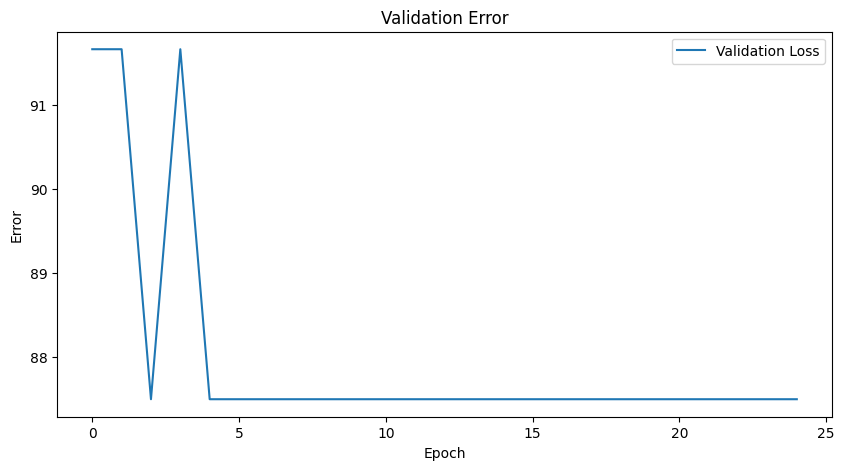

<Figure size 640x480 with 0 Axes>

In [18]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('validation_error_model_rnn.png')  # This will save the plot as an image

What happens if we filter out illegal moves in our prediction?

In [63]:

val_size = int(total_size * 0.04)
val_dataset = Subset(dataset, range(train_size, train_size + val_size))
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

model.eval()
val_correct = 0
val_total = 0

if val_loader is not None:
    with torch.no_grad():
        for boards, sequences, lengths, labels in val_loader:
            boards, sequences, lengths, labels = boards.to(device), sequences.to(device), lengths.to(device), labels.to(device)
            outputs = model(boards, sequences, lengths)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, label) in enumerate(zip(sequences, labels)):
                # This tells us we're looking at games that include the opening but has developed more than the first 4 half-moves
                if sequence[-1].item() == 0 and sequence[2].item() != 0 and sequence[3].item() != 0 and sequence[4].item() != 0:
                    output = probabilities[idx]
                    sorted_probs, sorted_indices = torch.sort(output, descending=True)
                    predicted_move = sorted_indices[0]
                    # print(predicted_move)
                    chess_board = load_board_state_from_san(sequence, vocab)
                    for move_idx in sorted_indices:
                        move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')
                        if is_legal_move(chess_board, move):
                            # print("we found one")
                            predicted_move = vocab.get_id(move)
                            break
                    
                    # Check if predicted move is correct
                    correct_move = label.item() # Convert label to move
                    # print(correct_move)
                    if predicted_move == correct_move:
                        val_correct += 1
                else:
                    minus += 1
            val_total += (labels.size(0) - minus)

        val_accuracy = 100 * val_correct / val_total
        print(f"Validation Accuracy: {val_accuracy}%")


hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey


In [64]:
torch.save(model.state_dict(), 'multimodalmodel.pth')

## Experiment 2 (CNN has 3 convolutions,SE, ReLu after combining inputs and larger RNN)

In [67]:
# We're scaling the model size so let's bring in more data as well
train_size = int(0.95 * total_size)
val_size = int(total_size * 0.04)

# Create subsets for training and validation
train_dataset = Subset(dataset, range(0, train_size))
val_dataset = Subset(dataset, range(train_size, train_size + val_size))
print(train_size)

1634630


In [77]:
# Reload the data with particular batch size
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Initialize model, loss function, and optimizer
d_hidden = 100
d_embed = 48
NUM_EPOCHS = 15
d_out = len(vocab.id_to_move.keys())
model = MultiModalTwo(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = nn.CrossEntropyLoss()
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.72 # This causes the LR to be 5e-5 by epoch 10
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

1131882


Epoch 1, Batch: 1000| Training Loss: 5.358224760532379
Epoch 1, Batch: 2000| Training Loss: 5.12661018884182
Epoch 1, Batch: 3000| Training Loss: 4.984487212657928
Epoch 1, Batch: 4000| Training Loss: 4.880090206086636
Epoch 1, Batch: 5000| Training Loss: 4.78517461733818
Epoch 1, Batch: 6000| Training Loss: 4.7084750316937765
Epoch 1, Batch: 7000| Training Loss: 4.644520375422069
Epoch 1, Batch: 8000| Training Loss: 4.584236370325089
Epoch 1, Batch: 9000| Training Loss: 4.53359999956025
Epoch 1, Batch: 10000| Training Loss: 4.487822722411155
Epoch 1, Batch: 11000| Training Loss: 4.445587667400186
Epoch 1, Batch: 12000| Training Loss: 4.40721798068285
Epoch 1, Batch: 13000| Training Loss: 4.372255387526292
Epoch 1, Batch: 14000| Training Loss: 4.34038493510655
Epoch 1, Batch: 15000| Training Loss: 4.310646494738261
Epoch 1, Batch: 16000| Training Loss: 4.282993175700307
Epoch 1, Batch: 17000| Training Loss: 4.257371399865431
Epoch 1, Batch: 18000| Training Loss: 4.234443660351965
Epoch

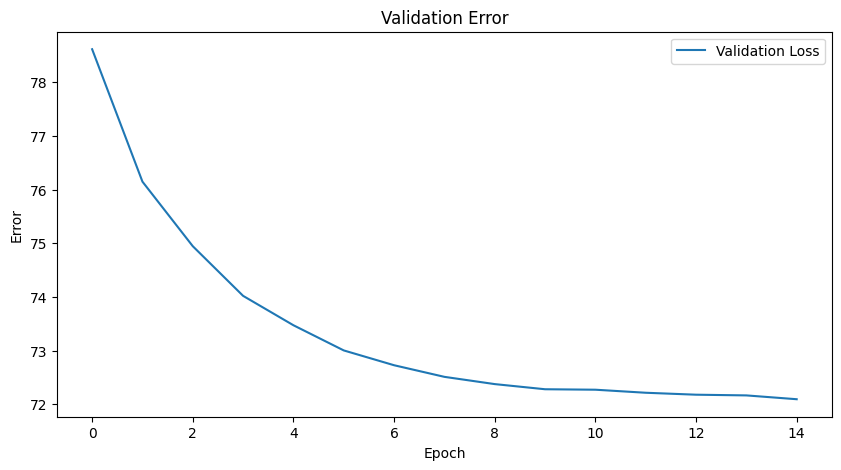

<Figure size 640x480 with 0 Axes>

In [78]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('validation_error_model_rnn.png')  # This will save the plot as an image

In [79]:
def is_legal_move(chess_board, move_san):
    try:
        chess_move = chess_board.parse_san(move_san)
        return chess_move in chess_board.legal_moves
    except ValueError:
        # This handles cases where the SAN move cannot be parsed or is not legal
        return False

def load_board_state_from_san(moves):
    board = chess.Board()
    for index in moves:
        try:
            if index == 0:
                return board
            else:
                move_san = vocab.get_move(index.item())
                move = board.parse_san(move_san)
                board.push(move)
        except ValueError:
            # Handle invalid moves, e.g., break the loop or log an error
            break
    return board

val_size = int(total_size * 0.04)
val_dataset = Subset(dataset, range(train_size, train_size + val_size))
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

model.eval()
val_correct = 0
val_total = 0

if val_loader is not None:
    with torch.no_grad():
        for boards, sequences, lengths, labels in val_loader:
            boards, sequences, lengths, labels = boards.to(device), sequences.to(device), lengths.to(device), labels.to(device)
            outputs = model(boards, sequences, lengths)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, label) in enumerate(zip(sequences, labels)):
                # This tells us we're looking at games that include the opening but has developed more than the first 4 half-moves
                if sequence[-1].item() == 0 and sequence[2].item() != 0 and sequence[3].item() != 0 and sequence[4].item() != 0:
                    output = probabilities[idx]
                    sorted_probs, sorted_indices = torch.sort(output, descending=True)
                    predicted_move = sorted_indices[0]
                    # print(predicted_move)
                    chess_board = load_board_state_from_san(sequence)
                    for move_idx in sorted_indices:
                        move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')
                        if is_legal_move(chess_board, move):
                            # print("we found one")
                            predicted_move = vocab.get_id(move)
                            break
                    
                    # Check if predicted move is correct
                    correct_move = label.item() # Convert label to move
                    # print(correct_move)
                    if predicted_move == correct_move:
                        val_correct += 1
                else:
                    minus += 1
            val_total += (labels.size(0) - minus)

        val_accuracy = 100 * val_correct / val_total
        print(f"Validation Accuracy: {val_accuracy}%")

Validation Accuracy: 37.41142857142857%


In [80]:
torch.save(model.state_dict(), 'multimodalmodel-2.pth')

## Experiment 3 (focal loss)

In [86]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Initialize model, loss function, and optimizer
d_hidden = 100
d_embed = 48
NUM_EPOCHS = 15
d_out = len(vocab.id_to_move.keys())
model = MultiModalTwo(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.72 # This causes the LR to be 5e-5 by epoch 10
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

1131882


In [87]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('validation_error_model_rnn.png')  # This will save the plot as an image

Epoch 1, Batch: 1000| Training Loss: 5.216632953643799
Epoch 1, Batch: 2000| Training Loss: 4.9681913522481915
Epoch 1, Batch: 3000| Training Loss: 4.809984962622325
Epoch 1, Batch: 4000| Training Loss: 4.693838460147381
Epoch 1, Batch: 5000| Training Loss: 4.583828910255432
Epoch 1, Batch: 6000| Training Loss: 4.49359255596002
Epoch 1, Batch: 7000| Training Loss: 4.419784398453576
Epoch 1, Batch: 8000| Training Loss: 4.352040460258722
Epoch 1, Batch: 9000| Training Loss: 4.294694580793381
Epoch 1, Batch: 10000| Training Loss: 4.244223247122765
Epoch 1, Batch: 11000| Training Loss: 4.197138833761215
Epoch 1, Batch: 12000| Training Loss: 4.153256935497125
Epoch 1, Batch: 13000| Training Loss: 4.113717842560548
Epoch 1, Batch: 14000| Training Loss: 4.077679372889655
Epoch 1, Batch: 15000| Training Loss: 4.044189786974589
Epoch 1, Batch: 16000| Training Loss: 4.012455889597535
Epoch 1, Batch: 17000| Training Loss: 3.9834087364673616
Epoch 1, Batch: 18000| Training Loss: 3.956665287401941


## Experiment 4 (attention)

In [5]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Initialize model, loss function, and optimizer
d_hidden = 128
d_embed = 64
NUM_EPOCHS = 15
d_out = len(vocab.id_to_move.keys())
model = MultiModalThree(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.72 # This causes the LR to be 5e-5 by epoch 10
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

1274809


In [6]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('validation_error_model_rnn.png')  # This will save the plot as an image

Epoch 1, Batch: 1000| Training Loss: 5.341400797367096
Epoch 1, Batch: 2000| Training Loss: 5.104148769617081
Epoch 1, Batch: 3000| Training Loss: 4.958387941122055
Epoch 1, Batch: 4000| Training Loss: 4.845341881453991
Epoch 1, Batch: 5000| Training Loss: 4.757985580158234
Epoch 1, Batch: 6000| Training Loss: 4.677461992899577
Epoch 1, Batch: 7000| Training Loss: 4.611756935562406
Epoch 1, Batch: 8000| Training Loss: 4.551932086467743
Epoch 1, Batch: 9000| Training Loss: 4.4986796903875135
Epoch 1, Batch: 10000| Training Loss: 4.450224746966362
Epoch 1, Batch: 11000| Training Loss: 4.404998965154995
Epoch 1, Batch: 12000| Training Loss: 4.362968833565712
Epoch 1, Batch: 13000| Training Loss: 4.324679346708151
Epoch 1, Batch: 14000| Training Loss: 4.288697275570461
Epoch 1, Batch: 15000| Training Loss: 4.256136773173014
Epoch 1, Batch: 16000| Training Loss: 4.225446952491999
Epoch 1, Batch: 17000| Training Loss: 4.196908189044279
Epoch 1, Batch: 18000| Training Loss: 4.1697194012535945

KeyboardInterrupt: 

## Experiment 5 
scaling experiment 3 more

In [10]:
# We're scaling the model size so let's bring in more data as well
train_size = int(0.95 * total_size)
val_size = int(total_size * 0.04)

# Create subsets for training and validation
train_dataset = Subset(dataset, range(0, train_size))
val_dataset = Subset(dataset, range(train_size, train_size + val_size))
print(train_size)

2887027


In [11]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 64
NUM_EPOCHS = 20
d_out = len(vocab.id_to_move.keys())
model = MultiModalTwo(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.72 # This causes the LR to be 5e-5 by epoch 10
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

2257737


Epoch 1, Batch: 1000| Training Loss: 4.8901955642700194
Epoch 1, Batch: 2000| Training Loss: 4.567499182343483
Epoch 1, Batch: 3000| Training Loss: 4.370153081734975
Epoch 1, Batch: 4000| Training Loss: 4.225781790912151
Epoch 1, Batch: 5000| Training Loss: 4.115331648445129
Epoch 1, Batch: 6000| Training Loss: 4.026681294282278
Epoch 1, Batch: 7000| Training Loss: 3.9509704538413457
Epoch 1, Batch: 8000| Training Loss: 3.886772244900465
Epoch 1, Batch: 9000| Training Loss: 3.830372013224496
Epoch 1, Batch: 10000| Training Loss: 3.78042985496521
Epoch 1, Batch: 11000| Training Loss: 3.73538499064879
Epoch 1, Batch: 12000| Training Loss: 3.694986932992935
Epoch 1, Batch: 13000| Training Loss: 3.658469080888308
Epoch 1, Batch: 14000| Training Loss: 3.6249415147134236
Epoch 1, Batch: 15000| Training Loss: 3.593752561632792
Epoch 1, Batch: 16000| Training Loss: 3.564824816510081
Epoch 1, Batch: 17000| Training Loss: 3.53814223948647
Epoch 1, Batch: 18000| Training Loss: 3.513119463377529
E

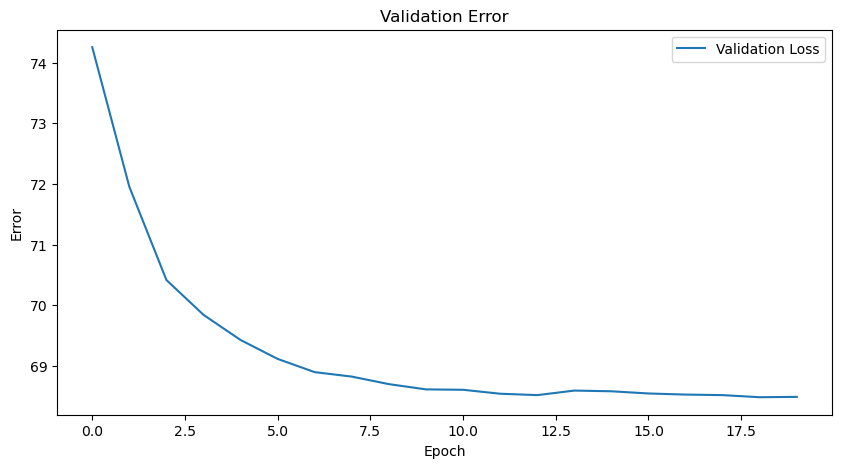

<Figure size 640x480 with 0 Axes>

In [12]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-jan-march-g5-feb-27.png')  # This will save the plot as an image

In [13]:
model.eval()
val_correct = 0
val_total = 0

if val_loader is not None:
    with torch.no_grad():
        for boards, sequences, lengths, labels in val_loader:
            boards, sequences, lengths, labels = boards.to(device, non_blocking = True), sequences.to(device, non_blocking = True), lengths, labels.to(device, non_blocking = True)
            outputs = model(boards, sequences, lengths)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, label) in enumerate(zip(sequences, labels)):
                # This tells us we're looking at games that include the opening but has developed more than the first 4 half-moves
                if sequence[-1].item() == 0 and sequence[2].item() != 0 and sequence[3].item() != 0 and sequence[4].item() != 0:
                    output = probabilities[idx]
                    sorted_probs, sorted_indices = torch.sort(output, descending=True)
                    predicted_move = sorted_indices[0]
                    # print(predicted_move)
                    chess_board = load_board_state_from_san(sequence, vocab)
                    for move_idx in sorted_indices:
                        move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')
                        if is_legal_move(chess_board, move):
                            # print("we found one")
                            predicted_move = vocab.get_id(move)
                            break
                    
                    # Check if predicted move is correct
                    correct_move = label.item() # Convert label to move
                    # print(correct_move)
                    if predicted_move == correct_move:
                        val_correct += 1
                else:
                    minus += 1
            val_total += (labels.size(0) - minus)

        val_accuracy = 100 * val_correct / val_total
        print(f"Validation Accuracy: {val_accuracy}%")

Validation Accuracy: 43.77431906614786%


In [23]:
torch.save(model.state_dict(), 'multimodalmodel-best.pth')

In [53]:
# train_loader = DataLoader(train_dataset, batch_size=1, shuffle=False)
# show_maps_on_training_data(vocab, model, train_loader, conv2 = False, multimodal= True)

torch.Size([1, 8121])
O-O-O
O-O-O
torch.Size([1, 12, 8, 8, 1])
torch.Size([1, 16, 1, 1, 1])
torch.Size([1, 1, 1, 1, 1])


RuntimeError: Sizes of tensors must match except in dimension 4. Expected size 12 but got size 16 for tensor number 1 in the list.

## Experiment 6 
SENetTwo baby -- hm it's not that promising... let's go back to this

In [6]:
# We're scaling the model size so let's bring in more data as well
train_size = int(0.95 * total_size)
val_size = int(total_size * 0.04)

# Create subsets for training and validation
train_dataset = Subset(dataset, range(0, train_size))
val_dataset = Subset(dataset, range(train_size, train_size + val_size))
print(train_size)

2887027


In [15]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 192
d_embed = 72
NUM_EPOCHS = 10
d_out = len(vocab.id_to_move.keys())
model = MultiModalFour(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.72 # This causes the LR to be 5e-5 by epoch 10
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

2159953


In [ ]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-jan-march-g5-feb-27.png')  # This will save the plot as an image

## Experiment 7
let's scale the RNN baby

In [6]:
# We're scaling the model size so let's bring in more data as well
train_size = int(0.95 * total_size)
val_size = int(total_size * 0.04)

# Create subsets for training and validation
train_dataset = Subset(dataset, range(0, train_size))
val_dataset = Subset(dataset, range(train_size, train_size + val_size))
print(train_size)

2887027


In [7]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 64
NUM_EPOCHS = 20
d_out = len(vocab.id_to_move.keys())
model = MultiModalFive(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.72 # This causes the LR to be 5e-5 by epoch 10
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

4381497


Epoch 1, Batch: 1000| Training Loss: 4.75900833439827
Epoch 1, Batch: 2000| Training Loss: 4.388382541537285
Epoch 1, Batch: 3000| Training Loss: 4.1606564864317575
Epoch 1, Batch: 4000| Training Loss: 4.006464679956436
Epoch 1, Batch: 5000| Training Loss: 3.886658103322983
Epoch 1, Batch: 6000| Training Loss: 3.7896334119240445
Epoch 1, Batch: 7000| Training Loss: 3.709531047446387
Epoch 1, Batch: 8000| Training Loss: 3.6415253961980345
Epoch 1, Batch: 9000| Training Loss: 3.580289804061254
Epoch 1, Batch: 10000| Training Loss: 3.526648753285408
Epoch 1, Batch: 11000| Training Loss: 3.478701816623861
Epoch 1, Batch: 12000| Training Loss: 3.4365540742476783
Epoch 1, Batch: 13000| Training Loss: 3.3983328068256378
Epoch 1, Batch: 14000| Training Loss: 3.362579758320536
Epoch 1, Batch: 15000| Training Loss: 3.330839539782206
Epoch 1, Batch: 16000| Training Loss: 3.3009322288632394
Epoch 1, Batch: 17000| Training Loss: 3.2732747440197887
Epoch 1, Batch: 18000| Training Loss: 3.24705731214

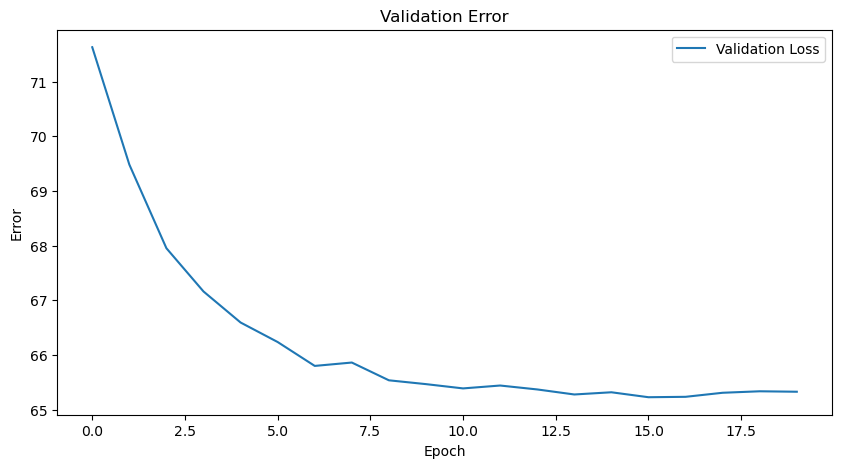

<Figure size 640x480 with 0 Axes>

In [8]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-jan-march-g5-feb-27.png')  # This will save the plot as an image

In [9]:
model.eval()
val_correct = 0
val_total = 0

if val_loader is not None:
    with torch.no_grad():
        for boards, sequences, lengths, labels in val_loader:
            boards, sequences, lengths, labels = boards.to(device, non_blocking = True), sequences.to(device, non_blocking = True), lengths, labels.to(device, non_blocking = True)
            outputs = model(boards, sequences, lengths)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, label) in enumerate(zip(sequences, labels)):
                # This tells us we're looking at games that include the opening but has developed more than the first 4 half-moves
                if sequence[-1].item() == 0 and sequence[2].item() != 0 and sequence[3].item() != 0 and sequence[4].item() != 0:
                    output = probabilities[idx]
                    sorted_probs, sorted_indices = torch.sort(output, descending=True)
                    predicted_move = sorted_indices[0]
                    # print(predicted_move)
                    chess_board = load_board_state_from_san(sequence, vocab)
                    for move_idx in sorted_indices:
                        move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')
                        if is_legal_move(chess_board, move):
                            # print("we found one")
                            predicted_move = vocab.get_id(move)
                            break
                    
                    # Check if predicted move is correct
                    correct_move = label.item() # Convert label to move
                    # print(correct_move)
                    if predicted_move == correct_move:
                        val_correct += 1
                else:
                    minus += 1
            val_total += (labels.size(0) - minus)

        val_accuracy = 100 * val_correct / val_total
        print(f"Validation Accuracy: {val_accuracy}%")

Validation Accuracy: 45.01369073353509%


## Experiment 8
let's scale all the way -- one more conv, dropout, and 256 from 128

In [26]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 64
NUM_EPOCHS = 13
d_out = len(vocab.id_to_move.keys())
model = MultiModalSeven(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.72 # This causes the LR to be 5e-5 by epoch 10
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

7159417


Epoch 1, Batch: 1000| Training Loss: 4.882390671253204
Epoch 1, Batch: 2000| Training Loss: 4.525710904359817
Epoch 1, Batch: 3000| Training Loss: 4.320944158951441
Epoch 1, Batch: 4000| Training Loss: 4.184255250036716
Epoch 1, Batch: 5000| Training Loss: 4.076336099815369
Epoch 1, Batch: 6000| Training Loss: 3.9911560486157733
Epoch 1, Batch: 7000| Training Loss: 3.9208499415261406
Epoch 1, Batch: 8000| Training Loss: 3.8593906884789466
Epoch 1, Batch: 9000| Training Loss: 3.807422089126375
Epoch 1, Batch: 10000| Training Loss: 3.760690544271469
Epoch 1, Batch: 11000| Training Loss: 3.7182563562826676
Epoch 1, Batch: 12000| Training Loss: 3.680358818133672
Epoch 1, Batch: 13000| Training Loss: 3.645879002167628
Epoch 1, Batch: 14000| Training Loss: 3.6136590048074724
Epoch 1, Batch: 15000| Training Loss: 3.584489521741867
Epoch 1, Batch: 16000| Training Loss: 3.557563627690077
Epoch 1, Batch: 17000| Training Loss: 3.5325243727599873
Epoch 1, Batch: 18000| Training Loss: 3.50886912435

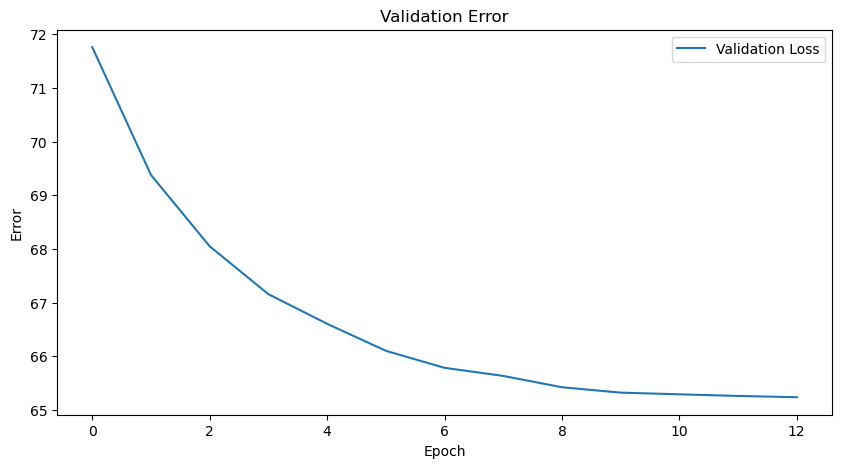

<Figure size 640x480 with 0 Axes>

In [27]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-big-jan-march-g5-march-1.png')  # This will save the plot as an image

In [28]:
model.eval()
val_correct = 0
val_total = 0

if val_loader is not None:
    with torch.no_grad():
        for boards, sequences, lengths, labels in val_loader:
            boards, sequences, lengths, labels = boards.to(device, non_blocking = True), sequences.to(device, non_blocking = True), lengths, labels.to(device, non_blocking = True)
            outputs = model(boards, sequences, lengths)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, label) in enumerate(zip(sequences, labels)):
                # This tells us we're looking at games that include the opening but has developed more than the first 4 half-moves
                if sequence[-1].item() == 0 and sequence[2].item() != 0 and sequence[3].item() != 0 and sequence[4].item() != 0:
                    output = probabilities[idx]
                    sorted_probs, sorted_indices = torch.sort(output, descending=True)
                    predicted_move = sorted_indices[0]
                    # print(predicted_move)
                    chess_board = load_board_state_from_san(sequence, vocab)
                    for move_idx in sorted_indices:
                        move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')
                        if is_legal_move(chess_board, move):
                            # print("we found one")
                            predicted_move = vocab.get_id(move)
                            break
                    
                    # Check if predicted move is correct
                    correct_move = label.item() # Convert label to move
                    # print(correct_move)
                    if predicted_move == correct_move:
                        val_correct += 1
                else:
                    minus += 1
            val_total += (labels.size(0) - minus)

        val_accuracy = 100 * val_correct / val_total
        print(f"Validation Accuracy: {val_accuracy}%")

Validation Accuracy: 45.38838449344286%


## Experiment 9 (transformer + cnn)

In [14]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 144
NUM_EPOCHS = 13
d_out = len(vocab.id_to_move.keys())
model = MultiModalEight(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.72 # This causes the LR to be 5e-5 by epoch 10
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

6176194


In [15]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-transformer-big-jan-march-g5-march-12.png')  # This will save the plot as an image

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu! (when checking argument for argument attn_bias in method wrapper_CUDA___scaled_dot_product_efficient_attention)

## Experiment 10 (let's test UCI vs SAN again)

In [14]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 64
NUM_EPOCHS = 13
d_out = len(vocab.id_to_move.keys())
model = MultiModalSeven(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.72 # This causes the LR to be 5e-5 by epoch 10
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

6379066


Epoch 1, Batch: 1000| Training Loss: 4.897263659477234
Epoch 1, Batch: 2000| Training Loss: 4.54452593934536
Epoch 1, Batch: 3000| Training Loss: 4.338220544179281
Epoch 1, Batch: 4000| Training Loss: 4.199373716056347
Epoch 1, Training Loss: 4.170152869959177, Validation Error: 77.84024055432083, Validation Top-3 Accuracy: 39.80040963999393, Training Error: 82.87768252943076
Epoch 2, Batch: 1000| Training Loss: 3.527833380460739
Epoch 2, Batch: 2000| Training Loss: 3.4979582372903826
Epoch 2, Batch: 3000| Training Loss: 3.4739475518862406
Epoch 2, Batch: 4000| Training Loss: 3.4509603621959686
Epoch 2, Training Loss: 3.4460714317476766, Validation Error: 74.68078615941081, Validation Top-3 Accuracy: 44.5156229614053, Training Error: 77.62234682793647
Epoch 3, Batch: 1000| Training Loss: 3.1950869634151458
Epoch 3, Batch: 2000| Training Loss: 3.1870646287202833
Epoch 3, Batch: 3000| Training Loss: 3.1778713244597117
Epoch 3, Batch: 4000| Training Loss: 3.1711829915642737
Epoch 3, Train

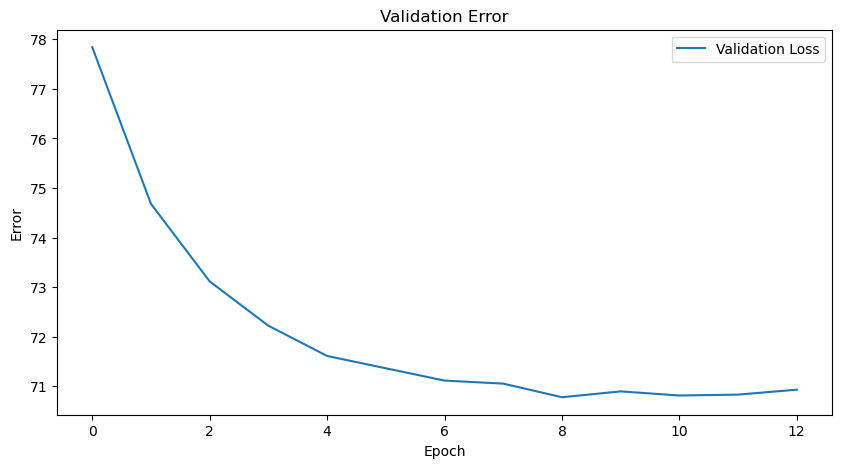

<Figure size 640x480 with 0 Axes>

In [15]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-big-jan-march-g5-march-1.png')  # This will save the plot as an image

haha_longer.csv

UCI Notation: 73.5
SAN Notation: 70.9

## Experiment 11

In [14]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 64
NUM_EPOCHS = 10
d_out = len(vocab.id_to_move.keys())
model = MultiModalSeven(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

7513159


Epoch 1, Batch: 1000| Training Loss: 4.884940878868103
Epoch 1, Batch: 2000| Training Loss: 4.518649207115173
Epoch 1, Batch: 3000| Training Loss: 4.317916671514511
Epoch 1, Batch: 4000| Training Loss: 4.173255751550197
Epoch 1, Batch: 5000| Training Loss: 4.069079575634003
Epoch 1, Batch: 6000| Training Loss: 3.983961423953374
Epoch 1, Batch: 7000| Training Loss: 3.914146698815482
Epoch 1, Batch: 8000| Training Loss: 3.8551448185741903
Epoch 1, Batch: 9000| Training Loss: 3.803800932486852
Epoch 1, Batch: 10000| Training Loss: 3.757317492723465
Epoch 1, Batch: 11000| Training Loss: 3.7157145851091906
Epoch 1, Batch: 12000| Training Loss: 3.6773039214015006
Epoch 1, Batch: 13000| Training Loss: 3.6436711629720833
Epoch 1, Batch: 14000| Training Loss: 3.6127345583098274
Epoch 1, Batch: 15000| Training Loss: 3.5845070272604627
Epoch 1, Batch: 16000| Training Loss: 3.558931604847312
Epoch 1, Batch: 17000| Training Loss: 3.534786127763636
Epoch 1, Batch: 18000| Training Loss: 3.51134337030

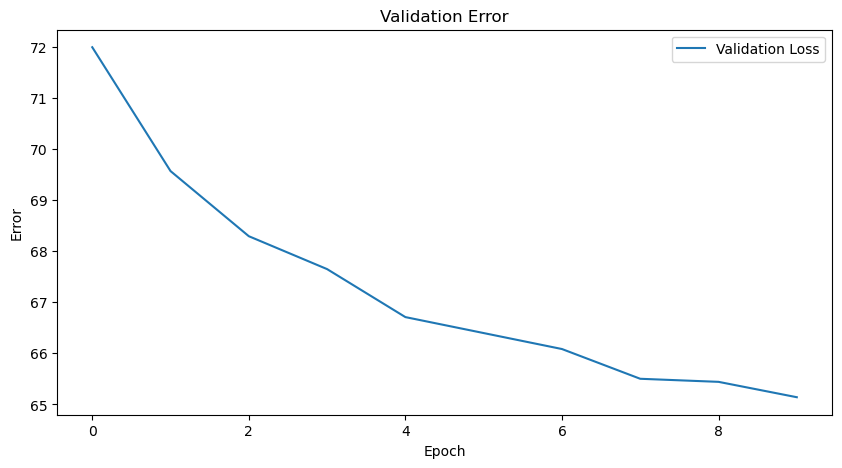

<Figure size 640x480 with 0 Axes>

In [15]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-exp-11-a-march-21.png')  # This will save the plot as an image

In [16]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 64
NUM_EPOCHS = 10
d_out = len(vocab.id_to_move.keys())
model = MultiModalSeven(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=4, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

7513159


Epoch 1, Batch: 1000| Training Loss: 4.787342163562775
Epoch 1, Batch: 2000| Training Loss: 4.418151967406273
Epoch 1, Batch: 3000| Training Loss: 4.207761375347773
Epoch 1, Batch: 4000| Training Loss: 4.059469418644905
Epoch 1, Batch: 5000| Training Loss: 3.949043340396881
Epoch 1, Batch: 6000| Training Loss: 3.8587934188048045
Epoch 1, Batch: 7000| Training Loss: 3.785067213671548
Epoch 1, Batch: 8000| Training Loss: 3.7230778307318686
Epoch 1, Batch: 9000| Training Loss: 3.668713038868374
Epoch 1, Batch: 10000| Training Loss: 3.6175182515144346
Epoch 1, Batch: 11000| Training Loss: 3.5733855834657495
Epoch 1, Batch: 12000| Training Loss: 3.5330885314941405
Epoch 1, Batch: 13000| Training Loss: 3.4957352023674892
Epoch 1, Batch: 14000| Training Loss: 3.462685422318322
Epoch 1, Batch: 15000| Training Loss: 3.431956423362096
Epoch 1, Batch: 16000| Training Loss: 3.402869468808174
Epoch 1, Batch: 17000| Training Loss: 3.3759299811335173
Epoch 1, Batch: 18000| Training Loss: 3.3513234215

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch 1, Batch: 22000| Training Loss: 3.2658962912993
Epoch 1, Training Loss: 3.255723549621487, Validation Error: 71.96176342352274, Validation Top-3 Accuracy: 49.35381172889146, Training Error: 77.53588726395701
Epoch 2, Batch: 1000| Training Loss: 2.7576602239608765
Epoch 2, Batch: 2000| Training Loss: 2.7481772196292877
Epoch 2, Batch: 3000| Training Loss: 2.7442877823511758
Epoch 2, Batch: 4000| Training Loss: 2.740328194797039
Epoch 2, Batch: 5000| Training Loss: 2.7350757746696472
Epoch 2, Batch: 6000| Training Loss: 2.731222266058127
Epoch 2, Batch: 7000| Training Loss: 2.726809011885098
Epoch 2, Batch: 8000| Training Loss: 2.722369820713997
Epoch 2, Batch: 9000| Training Loss: 2.718262392229504
Epoch 2, Batch: 10000| Training Loss: 2.7145348377943037
Epoch 2, Batch: 11000| Training Loss: 2.7110126688046887
Epoch 2, Batch: 12000| Training Loss: 2.7076148880422117
Epoch 2, Batch: 13000| Training Loss: 2.7029263212405716
Epoch 2, Batch: 14000| Training Loss: 2.6992133351819856
Ep

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>assert self._parent_pid == os.getpid(), 'can only test a child process'

Traceback (most recent call last):
AssertionError  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
: can only test a child processException ignored in:     self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>

  Fi

Epoch 3, Batch: 22000| Training Loss: 2.4845499521331353


Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>

Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py",

Epoch 3, Training Loss: 2.4836728327873145, Validation Error: 68.76002599560707, Validation Top-3 Accuracy: 54.45174770922287, Training Error: 71.6349379482769
Epoch 4, Batch: 1000| Training Loss: 2.376554756999016
Epoch 4, Batch: 2000| Training Loss: 2.369168887317181
Epoch 4, Batch: 3000| Training Loss: 2.3730789255698523
Epoch 4, Batch: 4000| Training Loss: 2.3715102743506433
Epoch 4, Batch: 5000| Training Loss: 2.372424793124199
Epoch 4, Batch: 6000| Training Loss: 2.3730313462615014
Epoch 4, Batch: 7000| Training Loss: 2.3740242608274733
Epoch 4, Batch: 8000| Training Loss: 2.373792770177126
Epoch 4, Batch: 9000| Training Loss: 2.373509221262402
Epoch 4, Batch: 10000| Training Loss: 2.3727736245036124
Epoch 4, Batch: 11000| Training Loss: 2.37140948397463
Epoch 4, Batch: 12000| Training Loss: 2.370241820404927
Epoch 4, Batch: 13000| Training Loss: 2.370270853803708
Epoch 4, Batch: 14000| Training Loss: 2.370317492936339
Epoch 4, Batch: 15000| Training Loss: 2.369706063103676
Epoch

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Exception ignored in: Exception ignored in: Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710><function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__

    Traceback (most recent call last):

self._shutdown_workers()  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__

Traceback (most recent call last):
    Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
self._shutdown_workers()        
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a

Epoch 4, Batch: 22000| Training Loss: 2.3657670992396094


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py",

Epoch 4, Training Loss: 2.3654311392582645, Validation Error: 67.82632302009723, Validation Top-3 Accuracy: 55.75317335654031, Training Error: 70.53813490486927
Epoch 5, Batch: 1000| Training Loss: 2.2793969441652298
Epoch 5, Batch: 2000| Training Loss: 2.277859414815903
Epoch 5, Batch: 3000| Training Loss: 2.2769273877541223
Epoch 5, Batch: 4000| Training Loss: 2.280144952058792
Epoch 5, Batch: 5000| Training Loss: 2.280906810092926
Epoch 5, Batch: 6000| Training Loss: 2.282576836884022
Epoch 5, Batch: 7000| Training Loss: 2.281957416875022
Epoch 5, Batch: 8000| Training Loss: 2.281469845846295
Epoch 5, Batch: 9000| Training Loss: 2.281979686750306
Epoch 5, Batch: 10000| Training Loss: 2.2826519790172575
Epoch 5, Batch: 11000| Training Loss: 2.282145409822464
Epoch 5, Batch: 12000| Training Loss: 2.282717888345321
Epoch 5, Batch: 13000| Training Loss: 2.2823976434102424
Epoch 5, Batch: 14000| Training Loss: 2.282626480962549
Epoch 5, Batch: 15000| Training Loss: 2.2821001768430076
Epo

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>Exception ignored in: Traceback (most recent call last):

Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__

      File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Traceback (most recent call last):
Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
    
Exception ignored in: Traceback (most recent call last):
self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>se

Epoch 5, Batch: 21000| Training Loss: 2.2808564294065747
Epoch 5, Batch: 22000| Training Loss: 2.2806306604472075
Epoch 5, Training Loss: 2.280472313498901, Validation Error: 67.28584473383296, Validation Top-3 Accuracy: 56.653970498450846, Training Error: 69.63204708511559
Epoch 6, Batch: 1000| Training Loss: 2.2174813877344133
Epoch 6, Batch: 2000| Training Loss: 2.21332281768322
Epoch 6, Batch: 3000| Training Loss: 2.214401470541954
Epoch 6, Batch: 4000| Training Loss: 2.21564183229208
Epoch 6, Batch: 5000| Training Loss: 2.2159265148162843
Epoch 6, Batch: 6000| Training Loss: 2.2165694733460746
Epoch 6, Batch: 7000| Training Loss: 2.2166660695586886
Epoch 6, Batch: 8000| Training Loss: 2.216279165521264
Epoch 6, Batch: 9000| Training Loss: 2.2167390927738615
Epoch 6, Batch: 10000| Training Loss: 2.2165863480210306
Epoch 6, Batch: 11000| Training Loss: 2.2160996168851854
Epoch 6, Batch: 12000| Training Loss: 2.216571936269601
Epoch 6, Batch: 13000| Training Loss: 2.2169935880074134


Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710><function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Exception ignored in: Traceback (most recent call last):

<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Traceback (most recent call last):
      File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__

self._shutdown_workers()    
self._shutdown_workers()  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
Traceback (most recent call last):

  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
        Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/to

Epoch 6, Batch: 20000| Training Loss: 2.215913903015852
Epoch 6, Batch: 21000| Training Loss: 2.215947240698905


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    
Traceback (most recent call last):
if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
        self._shutdown_workers()
assert self._parent_pid == os.getpid(), 'can only test a child process'  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

    Assertion

Epoch 6, Batch: 22000| Training Loss: 2.21567433701862
Epoch 6, Training Loss: 2.215848389371645, Validation Error: 66.65734334767478, Validation Top-3 Accuracy: 57.33018534219532, Training Error: 68.97583569533641
Epoch 7, Batch: 1000| Training Loss: 2.1702302942276
Epoch 7, Batch: 2000| Training Loss: 2.163045961916447
Epoch 7, Batch: 3000| Training Loss: 2.1629438608090084
Epoch 7, Batch: 4000| Training Loss: 2.160349977046251
Epoch 7, Batch: 5000| Training Loss: 2.160136836385727
Epoch 7, Batch: 6000| Training Loss: 2.1606613374352457
Epoch 7, Batch: 7000| Training Loss: 2.1612553257771903
Epoch 7, Batch: 8000| Training Loss: 2.1616559282541274
Epoch 7, Batch: 9000| Training Loss: 2.1617056498130163
Epoch 7, Batch: 10000| Training Loss: 2.1617198608517647
Epoch 7, Batch: 11000| Training Loss: 2.1620853752439673
Epoch 7, Batch: 12000| Training Loss: 2.1638891619344554
Epoch 7, Batch: 13000| Training Loss: 2.1636181682990148
Epoch 7, Batch: 14000| Training Loss: 2.1637061096344676
Ep

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>self._shutdown_workers()

Tra

Epoch 7, Batch: 20000| Training Loss: 2.1647903494000436
Epoch 7, Batch: 21000| Training Loss: 2.16471425026939
Epoch 7, Batch: 22000| Training Loss: 2.1649079515067013
Epoch 7, Training Loss: 2.164916887475709, Validation Error: 66.26823188739624, Validation Top-3 Accuracy: 58.008045476496896, Training Error: 68.37244681120059
Epoch 8, Batch: 1000| Training Loss: 2.1202422956228255
Epoch 8, Batch: 2000| Training Loss: 2.1217921189069746
Epoch 8, Batch: 3000| Training Loss: 2.1210997941096625
Epoch 8, Batch: 4000| Training Loss: 2.1213608585596084
Epoch 8, Batch: 5000| Training Loss: 2.122534281373024
Epoch 8, Batch: 6000| Training Loss: 2.1224825902581217
Epoch 8, Batch: 7000| Training Loss: 2.1218883590357644
Epoch 8, Batch: 8000| Training Loss: 2.1221419665962458
Epoch 8, Batch: 9000| Training Loss: 2.1225128039254084
Epoch 8, Batch: 10000| Training Loss: 2.122887987995148
Epoch 8, Batch: 11000| Training Loss: 2.123236596887762
Epoch 8, Batch: 12000| Training Loss: 2.122649182965358

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
    Traceback (most recent call last):
self._shutdown_workers()  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Exception ignored in: Exception ignored in: 
    <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710><function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

self._shutdown_workers()
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>    Exception ignored in: Traceback (most recent call last):

if w

Epoch 8, Batch: 20000| Training Loss: 2.1244526963233947
Epoch 8, Batch: 21000| Training Loss: 2.124878022761572
Epoch 8, Batch: 22000| Training Loss: 2.1254393832087515
Epoch 8, Training Loss: 2.1255530021323303, Validation Error: 66.07491012594707, Validation Top-3 Accuracy: 58.2466127552592, Training Error: 67.90057730668954
Epoch 9, Batch: 1000| Training Loss: 2.0855747710466384
Epoch 9, Batch: 2000| Training Loss: 2.0814012478590014
Epoch 9, Batch: 3000| Training Loss: 2.0836607281764348
Epoch 9, Batch: 4000| Training Loss: 2.0831792336404322
Epoch 9, Batch: 5000| Training Loss: 2.0862222786426545
Epoch 9, Batch: 6000| Training Loss: 2.085288426756859
Epoch 9, Batch: 7000| Training Loss: 2.086342215503965
Epoch 9, Batch: 8000| Training Loss: 2.0871801363676785
Epoch 9, Batch: 9000| Training Loss: 2.0882370366917717
Epoch 9, Batch: 10000| Training Loss: 2.0882960258483885
Epoch 9, Batch: 11000| Training Loss: 2.0877277774052185
Epoch 9, Batch: 12000| Training Loss: 2.08906703949968

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
Exception ignored in: AssertionError<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>: can only test a child process
Traceback (most recent call last):

  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py",

Epoch 9, Batch: 20000| Training Loss: 2.0912238572835924
Epoch 9, Batch: 21000| Training Loss: 2.091957664677075
Epoch 9, Batch: 22000| Training Loss: 2.0919513455412604
Epoch 9, Training Loss: 2.0923946942492404, Validation Error: 65.7779349945294, Validation Top-3 Accuracy: 58.65793565088083, Training Error: 67.5416267322751
Epoch 10, Batch: 1000| Training Loss: 2.0486644439697264
Epoch 10, Batch: 2000| Training Loss: 2.0506567006111145
Epoch 10, Batch: 3000| Training Loss: 2.0556260152260464
Epoch 10, Batch: 4000| Training Loss: 2.057042247354984
Epoch 10, Batch: 5000| Training Loss: 2.0587488955497744
Epoch 10, Batch: 6000| Training Loss: 2.0585318830609323
Epoch 10, Batch: 7000| Training Loss: 2.0614379027570995
Epoch 10, Batch: 8000| Training Loss: 2.0622047441899776
Epoch 10, Batch: 9000| Training Loss: 2.0632166199154325
Epoch 10, Batch: 10000| Training Loss: 2.0636872101783754
Epoch 10, Batch: 11000| Training Loss: 2.0632981221350755
Epoch 10, Batch: 12000| Training Loss: 2.06

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
Exception ignored in: Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>      File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__

self._shutdown_workers()Traceback (most recent call last):

      File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
self._shutdown_workers()        if w.is_alive():
self._shutdown_workers()

  File "/opt/conda/envs/pytorch/lib/python3

Epoch 10, Batch: 20000| Training Loss: 2.066702935373783
Epoch 10, Batch: 21000| Training Loss: 2.066809583856946
Epoch 10, Batch: 22000| Training Loss: 2.066774021896449
Epoch 10, Training Loss: 2.066684274143878, Validation Error: 65.68497601987512, Validation Top-3 Accuracy: 58.91542378715727, Training Error: 67.24838389111014


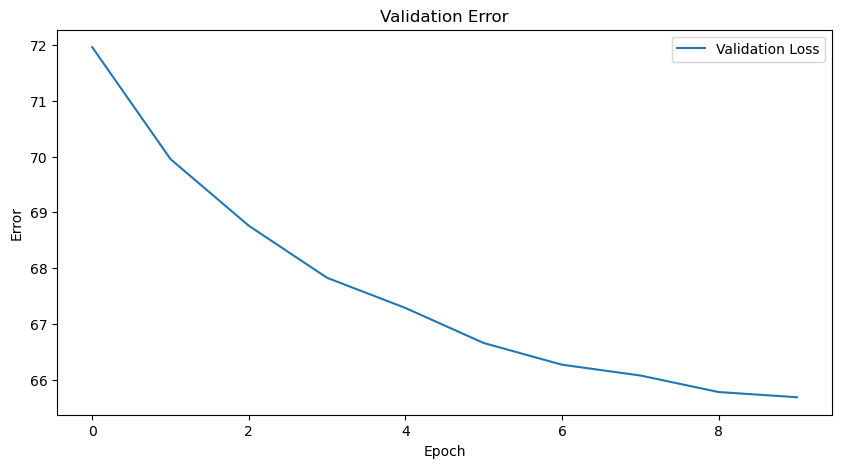

<Figure size 640x480 with 0 Axes>

In [17]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-biggest-exp-11-b-march-21.png')  # This will save the plot as an image

In [18]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 64
NUM_EPOCHS = 10
d_out = len(vocab.id_to_move.keys())
model = MultiModalSeven(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=8, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

7513159


Epoch 1, Batch: 1000| Training Loss: 4.553978064298629
Epoch 1, Batch: 2000| Training Loss: 4.162113577246666
Epoch 1, Batch: 3000| Training Loss: 3.9359476869106294
Epoch 1, Batch: 4000| Training Loss: 3.7843311128616333
Epoch 1, Batch: 5000| Training Loss: 3.668474065685272
Epoch 1, Batch: 6000| Training Loss: 3.5750964058240253
Epoch 1, Batch: 7000| Training Loss: 3.497243452991758
Epoch 1, Batch: 8000| Training Loss: 3.432864171296358
Epoch 1, Batch: 9000| Training Loss: 3.37480583108796
Epoch 1, Batch: 10000| Training Loss: 3.323003973698616
Epoch 1, Batch: 11000| Training Loss: 3.277115593108264
Epoch 1, Batch: 12000| Training Loss: 3.236668997923533
Epoch 1, Batch: 13000| Training Loss: 3.1993886801462907
Epoch 1, Batch: 14000| Training Loss: 3.16527675306797
Epoch 1, Batch: 15000| Training Loss: 3.132857938702901
Epoch 1, Batch: 16000| Training Loss: 3.1039954515844586
Epoch 1, Batch: 17000| Training Loss: 3.0772898871057173


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Exception ignored in: Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__

    Traceback (most recent call last):
self._shutdown_workers()  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__

      File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
self._shutdown_workers()    
if w.is_alive():  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
        assert self._parent_pid == os.getpid(), 'can only test a child process'if w.is_al

Epoch 1, Batch: 18000| Training Loss: 3.05228217903773
Epoch 1, Batch: 19000| Training Loss: 3.0289900544442627
Epoch 1, Batch: 20000| Training Loss: 3.0071255853354932
Epoch 1, Batch: 21000| Training Loss: 2.986276686622983


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py",

Epoch 1, Batch: 22000| Training Loss: 2.9669841865951363
Epoch 1, Training Loss: 2.9569893224623587, Validation Error: 72.84857558880873, Validation Top-3 Accuracy: 49.21807517378939, Training Error: 78.06722971416616
Epoch 2, Batch: 1000| Training Loss: 2.4577086201906204
Epoch 2, Batch: 2000| Training Loss: 2.4495919390320777
Epoch 2, Batch: 3000| Training Loss: 2.4434102933009467
Epoch 2, Batch: 4000| Training Loss: 2.4376968791782856
Epoch 2, Batch: 5000| Training Loss: 2.4329850197792053
Epoch 2, Batch: 6000| Training Loss: 2.430242646912734
Epoch 2, Batch: 7000| Training Loss: 2.4261691310746327
Epoch 2, Batch: 8000| Training Loss: 2.424072469383478
Epoch 2, Batch: 9000| Training Loss: 2.418935647620095
Epoch 2, Batch: 10000| Training Loss: 2.4149142907381056
Epoch 2, Batch: 11000| Training Loss: 2.4107076637311415
Epoch 2, Batch: 12000| Training Loss: 2.406192680567503
Epoch 2, Batch: 13000| Training Loss: 2.401806349690144
Epoch 2, Batch: 14000| Training Loss: 2.399487026427473

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
        self._shutdown_workers()
self._shutdown_workers()  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

      File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
if w.is_alive():    
if w.is_alive():  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    
Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python

Epoch 2, Batch: 18000| Training Loss: 2.3852871551844808
Epoch 2, Batch: 19000| Training Loss: 2.3819748821885964
Epoch 2, Batch: 20000| Training Loss: 2.378731309467554
Epoch 2, Batch: 21000| Training Loss: 2.3748712767192295


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
      File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
self._shutdown_workers()
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", 

Epoch 2, Batch: 22000| Training Loss: 2.371516891549934
Epoch 2, Training Loss: 2.369535432943244, Validation Error: 70.7936063968937, Validation Top-3 Accuracy: 52.115433658906795, Training Error: 74.0963974358397
Epoch 3, Batch: 1000| Training Loss: 2.2025065228939056
Epoch 3, Batch: 2000| Training Loss: 2.2073117482066156
Epoch 3, Batch: 3000| Training Loss: 2.2115420701901116
Epoch 3, Batch: 4000| Training Loss: 2.2098197772204875
Epoch 3, Batch: 5000| Training Loss: 2.2104168844461443
Epoch 3, Batch: 6000| Training Loss: 2.2077501462896665
Epoch 3, Batch: 7000| Training Loss: 2.2058857299940926
Epoch 3, Batch: 8000| Training Loss: 2.2045906316190957
Epoch 3, Batch: 9000| Training Loss: 2.2020524800221124
Epoch 3, Batch: 10000| Training Loss: 2.201173240852356
Epoch 3, Batch: 11000| Training Loss: 2.199164871866053
Epoch 3, Batch: 12000| Training Loss: 2.199122100194295
Epoch 3, Batch: 13000| Training Loss: 2.1972518069469014
Epoch 3, Batch: 14000| Training Loss: 2.195817978348051


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>Exception ignored in: 
Traceback (most recent call last):
Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>    
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>self._shutdown_workers()Traceback (most recent call last):


  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Exception ignored in: Traceback (most recent call last):
        <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
   

Epoch 3, Batch: 22000| Training Loss: 2.184674800542268
Epoch 3, Training Loss: 2.18374808619488, Validation Error: 69.48889016856012, Validation Top-3 Accuracy: 53.986952837030195, Training Error: 72.58539667277098
Epoch 4, Batch: 1000| Training Loss: 2.0828615723848345
Epoch 4, Batch: 2000| Training Loss: 2.0738463768959043
Epoch 4, Batch: 3000| Training Loss: 2.0696955821116765
Epoch 4, Batch: 4000| Training Loss: 2.069131850659847
Epoch 4, Batch: 5000| Training Loss: 2.0696151285648345
Epoch 4, Batch: 6000| Training Loss: 2.070867209951083
Epoch 4, Batch: 7000| Training Loss: 2.0692911738668167
Epoch 4, Batch: 8000| Training Loss: 2.0699704291671512
Epoch 4, Batch: 9000| Training Loss: 2.069987297375997
Epoch 4, Batch: 10000| Training Loss: 2.0694778403043745
Epoch 4, Batch: 11000| Training Loss: 2.0690222438898953
Epoch 4, Batch: 12000| Training Loss: 2.068436071683963
Epoch 4, Batch: 13000| Training Loss: 2.068504450110289
Epoch 4, Batch: 14000| Training Loss: 2.067877766489983
E

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch 4, Batch: 18000| Training Loss: 2.0650990691052544
Epoch 4, Batch: 19000| Training Loss: 2.0641350650787356
Epoch 4, Batch: 20000| Training Loss: 2.063396145898104
Epoch 4, Batch: 21000| Training Loss: 2.062710038906052


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>Traceback (most recent call last):

Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__

<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    Traceback (most recent call last):
assert self._parent_pid ==

Epoch 4, Batch: 22000| Training Loss: 2.0621678348129446
Epoch 4, Training Loss: 2.061666826127876, Validation Error: 68.60125535748072, Validation Top-3 Accuracy: 55.49733051557722, Training Error: 71.50681306409673
Epoch 5, Batch: 1000| Training Loss: 1.973818500638008
Epoch 5, Batch: 2000| Training Loss: 1.9836400894522668
Epoch 5, Batch: 3000| Training Loss: 1.9811300632158915
Epoch 5, Batch: 4000| Training Loss: 1.9781039229929447
Epoch 5, Batch: 5000| Training Loss: 1.9787461913347244
Epoch 5, Batch: 6000| Training Loss: 1.9788600489298502
Epoch 5, Batch: 7000| Training Loss: 1.9787644065618515
Epoch 5, Batch: 8000| Training Loss: 1.9789117411077022
Epoch 5, Batch: 9000| Training Loss: 1.978213353117307
Epoch 5, Batch: 10000| Training Loss: 1.9770839443206787
Epoch 5, Batch: 11000| Training Loss: 1.9773921638293699
Epoch 5, Batch: 12000| Training Loss: 1.9767284213403862
Epoch 5, Batch: 13000| Training Loss: 1.9765423425986217
Epoch 5, Batch: 14000| Training Loss: 1.9763643175363

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>    
assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionErrorTraceback (most recent call last):
Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>can only test a child process    
self._shutdown_workers()

Tra

Epoch 5, Batch: 20000| Training Loss: 1.974428334981203
Epoch 5, Batch: 21000| Training Loss: 1.9739943158229192


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive

    assert self._parent_pid == os.getpid(), 'can only test a child process'Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>Traceback (most recent call last):
AssertionError
Traceback (most recent call last):
:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/opt/conda/envs/pyt

Epoch 5, Batch: 22000| Training Loss: 1.9739801640673118
Epoch 5, Training Loss: 1.9740012094203396, Validation Error: 67.782722793047, Validation Top-3 Accuracy: 56.42692026055098, Training Error: 70.62795048331726
Epoch 6, Batch: 1000| Training Loss: 1.9009472986459732
Epoch 6, Batch: 2000| Training Loss: 1.8972974203824997
Epoch 6, Batch: 3000| Training Loss: 1.8982527461051941
Epoch 6, Batch: 4000| Training Loss: 1.9010231471955776
Epoch 6, Batch: 5000| Training Loss: 1.9034727054834366
Epoch 6, Batch: 6000| Training Loss: 1.9038110193411508
Epoch 6, Batch: 7000| Training Loss: 1.9048678387403488
Epoch 6, Batch: 8000| Training Loss: 1.9050259041190147
Epoch 6, Batch: 9000| Training Loss: 1.9045356532467737
Epoch 6, Batch: 10000| Training Loss: 1.9049738544583321
Epoch 6, Batch: 11000| Training Loss: 1.906084018642252
Epoch 6, Batch: 12000| Training Loss: 1.9069995988110702
Epoch 6, Batch: 13000| Training Loss: 1.9074125019403605
Epoch 6, Batch: 14000| Training Loss: 1.9076724351729

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    Exception ignored in: self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>

  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionErro

Epoch 6, Batch: 20000| Training Loss: 1.9081496834337712


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>    
self._shutdown_workers()Traceback (most recent call last):

  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
        if w.is_alive():self._shutdown_workers()

  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
        if w.is_alive():assert self._parent_pid == os.getpid(), 'can only test a child pr

Epoch 6, Batch: 21000| Training Loss: 1.907836381702196
Epoch 6, Batch: 22000| Training Loss: 1.9077788846221837
Epoch 6, Training Loss: 1.9078298472057977, Validation Error: 67.27679563010554, Validation Top-3 Accuracy: 57.05542164695431, Training Error: 69.95687951654071
Epoch 7, Batch: 1000| Training Loss: 1.8470479187965394
Epoch 7, Batch: 2000| Training Loss: 1.84951175147295
Epoch 7, Batch: 3000| Training Loss: 1.8571285773118338
Epoch 7, Batch: 4000| Training Loss: 1.8550725179910659
Epoch 7, Batch: 5000| Training Loss: 1.855821795320511
Epoch 7, Batch: 6000| Training Loss: 1.8564751813610394
Epoch 7, Batch: 7000| Training Loss: 1.8558744665213993
Epoch 7, Batch: 8000| Training Loss: 1.8548434590399265
Epoch 7, Batch: 9000| Training Loss: 1.8546364773909252
Epoch 7, Batch: 10000| Training Loss: 1.8546182007431984
Epoch 7, Batch: 11000| Training Loss: 1.8544899437969382
Epoch 7, Batch: 12000| Training Loss: 1.8553068829278152
Epoch 7, Batch: 13000| Training Loss: 1.85510601186752

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>    
Exception ignored in: self._shutdown_workers()Traceback (most recent call last):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
Exception ignored in: Exception ignored in:         
Traceback (most recent call last):
self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710><func

Epoch 7, Batch: 21000| Training Loss: 1.8567266308466592
Epoch 7, Batch: 22000| Training Loss: 1.85682337878509
Epoch 7, Training Loss: 1.85685418887298, Validation Error: 66.98311108186148, Validation Top-3 Accuracy: 57.73821765680082, Training Error: 69.4067980659689
Epoch 8, Batch: 1000| Training Loss: 1.8018838217258453
Epoch 8, Batch: 2000| Training Loss: 1.8012015897631646
Epoch 8, Batch: 3000| Training Loss: 1.8049259320100148
Epoch 8, Batch: 4000| Training Loss: 1.8082674147188664
Epoch 8, Batch: 5000| Training Loss: 1.8084468566179275
Epoch 8, Batch: 6000| Training Loss: 1.8105283648967743
Epoch 8, Batch: 7000| Training Loss: 1.8110238957234792
Epoch 8, Batch: 8000| Training Loss: 1.8109686513245107
Epoch 8, Batch: 9000| Training Loss: 1.810733205901252
Epoch 8, Batch: 10000| Training Loss: 1.8120136140823364
Epoch 8, Batch: 11000| Training Loss: 1.813166262106462
Epoch 8, Batch: 12000| Training Loss: 1.8135187071065109
Epoch 8, Batch: 13000| Training Loss: 1.8141118309772932


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: Exception ignored in: can only test a child process
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py",

Epoch 8, Batch: 19000| Training Loss: 1.8152636659521806


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Exception ignored in: Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>    
Traceback (most recent call last):
self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
      File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/p

Epoch 8, Batch: 20000| Training Loss: 1.8156669364154339
Epoch 8, Batch: 21000| Training Loss: 1.8156722093139377
Epoch 8, Batch: 22000| Training Loss: 1.8161308350779795
Epoch 8, Training Loss: 1.81640862344612, Validation Error: 66.49363683478805, Validation Top-3 Accuracy: 58.18902755026052, Training Error: 68.96773047151966
Epoch 9, Batch: 1000| Training Loss: 1.7843218898773194
Epoch 9, Batch: 2000| Training Loss: 1.7820042304396628
Epoch 9, Batch: 3000| Training Loss: 1.774987686395645
Epoch 9, Batch: 4000| Training Loss: 1.7755068451464175
Epoch 9, Batch: 5000| Training Loss: 1.7749111651420593
Epoch 9, Batch: 6000| Training Loss: 1.774188779850801
Epoch 9, Batch: 7000| Training Loss: 1.7768079644952501
Epoch 9, Batch: 8000| Training Loss: 1.7776745860427619
Epoch 9, Batch: 9000| Training Loss: 1.7777742349174288
Epoch 9, Batch: 10000| Training Loss: 1.7775615111470222
Epoch 9, Batch: 11000| Training Loss: 1.7786952120282433
Epoch 9, Batch: 12000| Training Loss: 1.77900422076384

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710><function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
        self._shutdown_workers()self._shutdown_workers()
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Exception ignored in:   File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/util

Epoch 9, Batch: 19000| Training Loss: 1.7821804414987563


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Exception ignored in: Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    Traceback (most recent call last):
self._shutdown_workers()  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__

  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
        self._shutdown_workers()if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

      File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
if w.is_alive():    
assert self._parent_pid == os.getpid(), 'can only test a child p

Epoch 9, Batch: 20000| Training Loss: 1.7819276163637638
Epoch 9, Batch: 21000| Training Loss: 1.7826510330779213
Epoch 9, Batch: 22000| Training Loss: 1.7829217888767068
Epoch 9, Training Loss: 1.783123069680522, Validation Error: 66.31183211444647, Validation Top-3 Accuracy: 58.47695357951985, Training Error: 68.5880319096427
Epoch 10, Batch: 1000| Training Loss: 1.7509088016748429
Epoch 10, Batch: 2000| Training Loss: 1.7502914954423905
Epoch 10, Batch: 3000| Training Loss: 1.750937167485555
Epoch 10, Batch: 4000| Training Loss: 1.7529902469813823
Epoch 10, Batch: 5000| Training Loss: 1.7552305000782014
Epoch 10, Batch: 6000| Training Loss: 1.7550765541593234
Epoch 10, Batch: 7000| Training Loss: 1.7542373739310673
Epoch 10, Batch: 8000| Training Loss: 1.755263951525092
Epoch 10, Batch: 9000| Training Loss: 1.7555886654986275
Epoch 10, Batch: 10000| Training Loss: 1.7552939400792122
Epoch 10, Batch: 11000| Training Loss: 1.7554630295471711
Epoch 10, Batch: 12000| Training Loss: 1.75

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>Traceback (most recent call last):

Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
        self._shutdown_workers()
self._shutdown_workers()  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
Exception ignored in: if w.is_alive():    <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", l

Epoch 10, Batch: 18000| Training Loss: 1.7558671974274846


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3019f9a710>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch 10, Batch: 19000| Training Loss: 1.7561193678880993
Epoch 10, Batch: 20000| Training Loss: 1.7568548338770866
Epoch 10, Batch: 21000| Training Loss: 1.757138634057272
Epoch 10, Batch: 22000| Training Loss: 1.7568334259878506
Epoch 10, Training Loss: 1.757079585849565, Validation Error: 66.22956753510641, Validation Top-3 Accuracy: 58.741022877093044, Training Error: 68.28231949337501


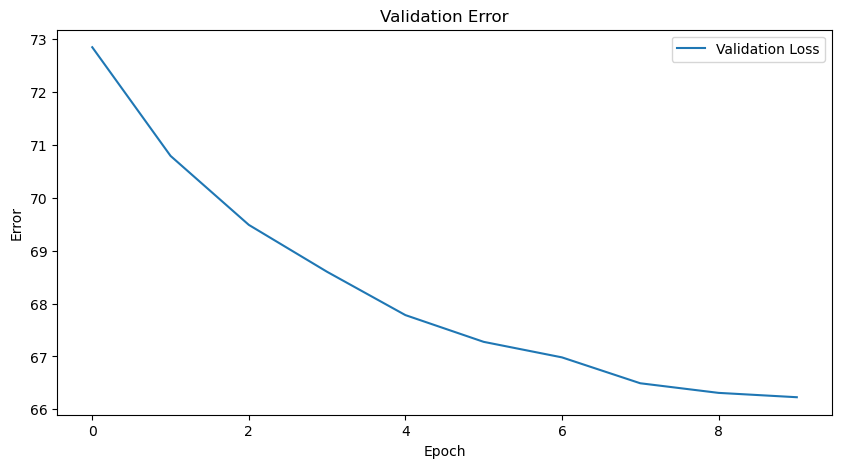

<Figure size 640x480 with 0 Axes>

In [19]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-biggest-exp-11-c-march-21.png')  # This will save the plot as an image

## Experiment 12: Scale data + fix huge bug we've had + CLS token

In [13]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 64
NUM_EPOCHS = 7
d_out = len(vocab.id_to_move.keys())
model = MultiModalSeven(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

6379387


In [14]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_with_fen(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-biggest-march-21.png')  # This will save the plot as an image

Epoch 1, Batch: 1000| Training Loss: 4.78584054350853
Epoch 1, Batch: 2000| Training Loss: 4.3297509359121324
Epoch 1, Batch: 3000| Training Loss: 4.07441492319107
Epoch 1, Batch: 4000| Training Loss: 3.9040379486083983
Epoch 1, Training Loss: 3.8478489099970616, Validation Error: 71.455938697318, Validation Top-3 Accuracy: 47.26576099242951, Training Error: 78.74989781810557
Epoch 2, Batch: 1000| Training Loss: 3.0907130634784696
Epoch 2, Batch: 2000| Training Loss: 3.054299299240112
Epoch 2, Batch: 3000| Training Loss: 3.024403820514679
Epoch 2, Batch: 4000| Training Loss: 2.999275652348995
Epoch 2, Training Loss: 2.9902694008961466, Validation Error: 69.2093347265761, Validation Top-3 Accuracy: 53.326367062378, Training Error: 71.37041025586346
Epoch 3, Batch: 1000| Training Loss: 2.705103858947754
Epoch 3, Batch: 2000| Training Loss: 2.6991148052215577
Epoch 3, Batch: 3000| Training Loss: 2.695103470484416
Epoch 3, Batch: 4000| Training Loss: 2.68617689460516
Epoch 3, Training Loss

In [ ]:
model.eval()
val_correct = 0
val_total = 0

if val_loader is not None:
    with torch.no_grad():
        for boards, sequences, lengths, labels in val_loader:
            boards, sequences, lengths, labels = boards.to(device, non_blocking = True), sequences.to(device, non_blocking = True), lengths, labels.to(device, non_blocking = True)
            outputs = model(boards, sequences, lengths)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, label) in enumerate(zip(sequences, labels)):
                output = probabilities[idx]
                sorted_probs, sorted_indices = torch.sort(output, descending=True)
                predicted_move = sorted_indices[0]
                # print(predicted_move)
                chess_board = load_board_state_from_san(sequence, vocab)
                for move_idx in sorted_indices:
                    move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')
                    if is_legal_move(chess_board, move):
                        # print("we found one")
                        predicted_move = vocab.get_id(move)
                        break
                
                # Check if predicted move is correct
                correct_move = label.item() # Convert label to move
                # print(correct_move)
                if predicted_move == correct_move:
                    val_correct += 1
            val_total += (labels.size(0) - minus)

        val_accuracy = 100 * val_correct / val_total
        print(f"Validation Accuracy: {val_accuracy}%")

In [ ]:
torch.save(model.state_dict(), 'multimodalmodel-exp-12-black-1100.pth')

In [15]:
d_hidden = 256
d_embed = 64
d_out = len(vocab.id_to_move.keys())
model = MultiModalSeven(vocab,d_embed,d_hidden,d_out) 
model.load_state_dict(torch.load('multimodalmodel-exp-12.pth', map_location=torch.device('cpu') ))
model = model.to(device)

In [57]:
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

model.eval()
val_correct = 0
val_total = 0
similars = 0
similars_correct= 0
if val_loader is not None:
    with torch.no_grad():
        for boards, sequences, lengths, labels in val_loader:
            boards, sequences, lengths, labels = boards.to(device, non_blocking = True), sequences.to(device, non_blocking = True), lengths, labels.to(device, non_blocking = True)
            outputs = model(boards, sequences, lengths)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, label) in enumerate(zip(sequences, labels)):
                # This tells us we're looking at games that include the opening but has developed more than the first 4 half-moves
                if sequence[-1].item() == 0 and sequence[-2].item() != 0:
                    output = probabilities[idx]
                    sorted_probs, sorted_indices = torch.sort(output, descending=True)
                    predicted_move = sorted_indices[0]
                    # print(predicted_move)
                    chess_board = load_board_state_from_san(sequence, vocab)
                    for move_idx in sorted_indices:
                        move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')
                        if is_legal_move(chess_board, move):
                            # print("we found one")
                            predicted_move = vocab.get_id(move)
                            break
                    
                    # Check if predicted move is correct
                    correct_move = label.item() # Convert label to move
                    # print(correct_move)
                    if sorted_probs[0]-sorted_probs[1] < 0.05:
                        similars += 1
                        if predicted_move == correct_move:
                            similars_correct += 1
                    if predicted_move == correct_move:
                        val_correct += 1
                    else: 
                        print(chess_board)
                        print(vocab.get_move(label.item()))
                        print(vocab.get_move(predicted_move))
                else:
                    minus += 1
            val_total += (labels.size(0) - minus)
        print(similars)
        print(similars_correct/similars)
        val_accuracy = 100 * val_correct / val_total
        print(f"Validation Accuracy: {val_accuracy}%")

[W ParallelNative.cpp:230] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)


[W ParallelNative.cpp:230] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)
[W ParallelNative.cpp:230] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)
[W ParallelNative.cpp:230] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)
[W ParallelNative.cpp:230] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)
[W ParallelNative.cpp:230] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)


r n b . . . n r
p p p q b k . p
. . . p p p p .
. . . . . . . .
. . . P . P . .
. . . . P N P .
P P P . . . B P
R N B Q . R K .
e4
Nc3
r . . q k b . r
. b p p . p p p
p . . . . n . .
. p . . p . B .
. . . n P . . .
P . N P . N . .
. P P . B P P P
R . . Q K . . R
Nxe5
Nxd4
r n b q . r k .
p p p . . p p .
. . . . p b . p
. . . p . . . .
. . P P . . . .
. . . B P N . .
P P . . . P P P
R N . Q K . . R
O-O
cxd5
r . . q . r k .
p p p . p p b p
. . n p . n p .
. . . . . . . .
. . B P P . b .
. . N . . N . .
P P P . . P P P
R . B Q R . K .
Be2
h3
r . b q . r k .
. p p p . p p p
p . . . . n . .
. . b . p . . .
. . B n P . . .
. . N P . N . .
P P P . Q P P P
R . B . . R K .
Qd1
Nxd4
r . b q k . . r
p p p . . p p .
. . n . p b . p
. . . p . . . .
. . P P . . . .
. . N . . P . .
P P . Q P . P P
R . . . K B N R
O-O-O
e3
r n b q . r k .
p p . . p p . p
. . . p . b p .
. . p . . . . .
. . B . P . . .
. . . P . N . .
P P P . . P P P
R . B Q K . . R
h3
Bh6
r . b . k b n r
p p . . . p p p
. . n . . . . 

[W ParallelNative.cpp:230] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)
[W ParallelNative.cpp:230] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)


r . b q k . . r
p p p p b p p p
. . n . p . . .
. . . . . . . n
. . . P . B . .
. . P B P N . .
P P . N . P P P
R . . Q K . . R
Be5
Bg3
r n b q k . . r
. p . . b p p p
p . . p p n . .
. . . . . . B .
. . . N P P . .
. . N . . . . .
P P P . . . P P
R . . Q K B . R
Bd3
e5
r . b q . r k .
p . . p p p b p
. p n . . n p .
. . P . . . . .
. . . . P B . .
. . P Q . N . .
P P . . . P P P
R N . . K B . R
e5
cxb6


KeyboardInterrupt: 

In [ ]:
model.eval()
val_correct = 0
val_total = 0

if val_loader is not None:
    with torch.no_grad():
        for boards, sequences, lengths, labels in val_loader:
            boards, sequences, lengths, labels = boards.to(device, non_blocking=True), sequences.to(device, non_blocking=True), lengths, labels.to(device, non_blocking=True)
            outputs = model(boards, sequences, lengths)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, label) in enumerate(zip(sequences, labels)):
                output = probabilities[idx]
                sorted_probs, sorted_indices = torch.sort(output, descending=True)
                chess_board = load_board_state_from_san(sequence, vocab)
                legal_moves_found = 0
                correct_move_found_within_top_3 = False

                for move_idx in sorted_indices:
                    move = vocab.get_move(move_idx.item())  # Convert index to move
                    if is_legal_move(chess_board, move):
                        if vocab.get_id(move) == label.item():  # Check if this legal move is the correct one
                            correct_move_found_within_top_3 = True
                            break
                        legal_moves_found += 1
                        if legal_moves_found == 3:  # Stop after finding top 3 legal moves
                            break
                
                if correct_move_found_within_top_3:
                    val_correct += 1
            val_total += (labels.size(0) - minus)

        val_accuracy = 100 * val_correct / val_total
        print(f"Top-3 Validation Accuracy (with only legal moves allowed): {val_accuracy}%")

## Doing exp12 for the black model

In [44]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=6, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=6,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 64
NUM_EPOCHS = 10
d_out = len(vocab.id_to_move.keys())
model = MultiModalSeven(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

6474403


Epoch 1, Batch: 1000| Training Loss: 4.558106299877167
Epoch 1, Batch: 2000| Training Loss: 4.148645375013351
Epoch 1, Batch: 3000| Training Loss: 3.9159037160078682
Epoch 1, Batch: 4000| Training Loss: 3.7577160720825193
Epoch 1, Batch: 5000| Training Loss: 3.6351773005485533
Epoch 1, Batch: 6000| Training Loss: 3.536519457936287
Epoch 1, Batch: 7000| Training Loss: 3.4540571825504305
Epoch 1, Batch: 8000| Training Loss: 3.3833810150027275
Epoch 1, Batch: 9000| Training Loss: 3.3213215834564633
Epoch 1, Batch: 10000| Training Loss: 3.2682195226669313
Epoch 1, Batch: 11000| Training Loss: 3.221042022488334
Epoch 1, Batch: 12000| Training Loss: 3.177568260292212
Epoch 1, Batch: 13000| Training Loss: 3.138712532850412
Epoch 1, Training Loss: 3.1286326507641955, Validation Error: 64.75476053087132, Validation Top-3 Accuracy: 58.10155798160335, Training Error: 72.09655063585544
Epoch 2, Batch: 1000| Training Loss: 2.5371495236158372
Epoch 2, Batch: 2000| Training Loss: 2.5208504972457884
E

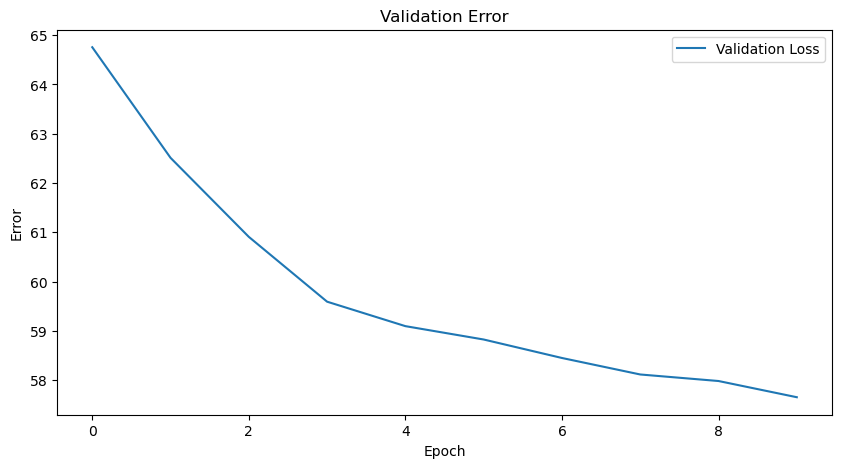

<Figure size 640x480 with 0 Axes>

In [45]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_with_fen(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-biggest-march-21.png')  # This will save the plot as an image

In [12]:
model.eval()
val_correct = 0
val_total = 0

if val_loader is not None:
    with torch.no_grad():
        for boards, sequences, lengths, fen, labels in val_loader:
            boards, sequences, lengths, labels = boards.to(device, non_blocking = True), sequences.to(device, non_blocking = True), lengths, labels.to(device, non_blocking = True)
            outputs = model(boards, sequences, lengths)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, label) in enumerate(zip(sequences, labels)):
                output = probabilities[idx]
                sorted_probs, sorted_indices = torch.sort(output, descending=True)
                predicted_move = sorted_indices[0]
                # print(predicted_move)
                chess_board = chess.Board(fen)
                for move_idx in sorted_indices:
                    move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')
                    if is_legal_move(chess_board, move):
                        # print("we found one")
                        predicted_move = vocab.get_id(move)
                        break
                
                # Check if predicted move is correct
                correct_move = label.item() # Convert label to move
                # print(correct_move)
                if predicted_move == correct_move:
                    val_correct += 1
            val_total += (labels.size(0) - minus)

        val_accuracy = 100 * val_correct / val_total
        print(f"Validation Accuracy: {val_accuracy}%")

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f10ea7377f0>>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


KeyboardInterrupt: 

In [46]:
torch.save(model.state_dict(), 'multimodalmodel-exp-12-black-2100.pth')

## Experiment 13

In [17]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 1024
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=4,pin_memory=True)

# Initialize model, loss function, and optimizer
d_hidden = 256
d_embed = 64
NUM_EPOCHS = 10
d_out = len(vocab.id_to_move.keys())
model = MultiModalNine(vocab,d_embed,d_hidden,d_out) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 2e-3
weight_decay=1e-7
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

8089202


In [18]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_with_fen(device, model, train_loader, val_loader, criterion, optimizer, NUM_EPOCHS, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-biggest-march-21.png')  # This will save the plot as an image

Epoch 1, Batch: 1000| Training Loss: 3.459892590761185
Epoch 1, Batch: 2000| Training Loss: 3.0522695088386538
Epoch 1, Batch: 3000| Training Loss: 2.8456564548015595
Epoch 1, Batch: 4000| Training Loss: 2.71192764377594
Epoch 1, Batch: 5000| Training Loss: 2.6139288881778717
Epoch 1, Batch: 6000| Training Loss: 2.5375783131321272
Epoch 1, Batch: 7000| Training Loss: 2.47457604430403
Epoch 1, Batch: 8000| Training Loss: 2.4217918388992548
Epoch 1, Batch: 9000| Training Loss: 2.376533526764976
Epoch 1, Batch: 10000| Training Loss: 2.3370382744550704
Epoch 1, Training Loss: 2.309610694594313, Validation Error: 59.09845788849348, Validation Top-3 Accuracy: 67.47374895193954, Training Error: 65.09265966054504
Epoch 2, Batch: 1000| Training Loss: 1.8898908514976502


KeyboardInterrupt: 

In [21]:
model.eval()
val_correct = 0
val_total = 0

if val_loader is not None:
    with torch.no_grad():
        for boards, sequences, lengths, fens, labels in val_loader:
            boards, sequences, lengths, labels = boards.to(device, non_blocking = True), sequences.to(device, non_blocking = True), lengths, labels.to(device, non_blocking = True)
            outputs = model(boards, sequences, lengths)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, fen, label) in enumerate(zip(sequences, fens, labels)):
                output = probabilities[idx]
                sorted_probs, sorted_indices = torch.sort(output, descending=True)
                predicted_move = sorted_indices[0]
                # print(predicted_move)
                chess_board = chess.Board(fen)
                for move_idx in sorted_indices:
                    move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')
                    if is_legal_move(chess_board, move):
                        # print("we found one")
                        predicted_move = vocab.get_id(move)
                        break
                
                # Check if predicted move is correct
                correct_move = label.item() # Convert label to move
                # print(correct_move)
                if predicted_move == correct_move:
                    val_correct += 1
            val_total += (labels.size(0) - minus)

        val_accuracy = 100 * val_correct / val_total
        print(f"Validation Accuracy: {val_accuracy}%")

rnbqkbnr/pppppppp/8/8/3P4/8/PPP1PPPP/RNBQKBNR b KQkq - 0 1
r2qkb1r/pppn1ppp/5n2/4p3/2B1P3/5Q2/PPP2PPP/RNBR2K1 b kq - 5 8
8/5pk1/p2p4/1pp1nPpr/5n1q/2P1QP1P/PP3P1R/3B1K1R b - - 2 29
6k1/pR3pp1/7p/1P6/P3r2P/5KP1/8/7r b - - 6 40
r3k2r/p4ppp/1qp1bB2/3p4/8/5N1P/PPP3P1/RN2Q2K b kq - 0 14
rn2k2r/ppp2ppp/1b3n2/4Nq2/3P4/4P3/PP2QPPP/R1B2RK1 b kq - 0 14
rnbqkbnr/pppppppp/8/8/4P3/8/PPPP1PPP/RNBQKBNR b KQkq - 0 1
8/2prkp1p/1p6/4Q3/1b6/1P1qPN2/P4KPP/2R4R b - - 1 25
8/1b1k4/7R/2K3pP/5nP1/8/8/8 b - - 0 71
rnbqr1k1/pp2ppbp/3p1npB/8/3NP3/2N2P2/PPPQ2PP/R3KB1R b KQ - 6 9
r1bq1rk1/1pp2pp1/2np1n1p/pBb1p3/P3P3/2PP1N2/1P1N1PPP/R1BQR1K1 b - - 1 10
r3kbnr/ppp1ppp1/2n5/3qP3/3P4/2N1BN2/PPP4P/R2QKR2 b Qkq - 2 10
rnbqkbnr/pppppppp/8/8/4P3/8/PPPP1PPP/RNBQKBNR b KQkq - 0 1
rnbqkbnr/pppppppp/8/8/4P3/8/PPPP1PPP/RNBQKBNR b KQkq - 0 1
rnbq1rk1/4bppp/2pp1n2/pp2p3/3PP3/2P2N1P/PP1NBPP1/R1BQK2R b KQ - 2 9
rnbqkbnr/pppppppp/8/8/4P3/8/PPPP1PPP/RNBQKBNR b KQkq - 0 1
8/8/4Rp2/ppp3k1/4P3/PKP2n1P/1P1r4/8 b - - 0 45
rnbqkbnr/ppppppp

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f38936edcf0>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1442, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 149, in join
    res = self._popen.wait(timeout)
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/popen_fork.py", line 40, in wait
    if not wait([self.sentinel], timeout):
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/connection.py", line 931, in wait
    ready = selector.select(timeout)
  File "/opt/conda/envs/pytorch/lib/python3.10/selectors.py", line 416, in select
    fd_event_list = self._selector.poll(timeout)
KeyboardInterrupt:

r2q1rk1/ppp2ppp/2nbp1b1/8/2PPP3/5N1P/PB2BPP1/R2Q1RK1 b - - 0 14
r1bqk2r/pppp1ppp/2n4n/2b3N1/2BpP3/8/PPP2PPP/RNBQ1RK1 b kq - 7 6
rn2kbnr/p4pp1/2pp3p/1p2p3/4P3/1BNP1P1P/PPP2P2/R1B2RK1 b kq - 1 10
r1b1k2r/ppp2ppp/3b4/2q1P3/2p5/2N5/PP4PP/R1BQR2K b kq - 0 14
r1bqk2r/pp1nbp2/3p3p/2pPp1pn/1PP1P3/P1NB1NP1/1BQ2P1P/R4RK1 b kq - 0 14
r2q2k1/1p1brp2/p1p2Q2/8/8/2N5/PPP2PPP/2KR3R b - - 0 21
rnbqkbnr/ppp2ppp/4p3/3p4/6P1/2P5/PP1PPPBP/RNBQK1NR b KQkq - 0 3
r1bqkbnr/pppp1ppp/2n5/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R b KQkq - 3 3
r3k2r/1pp1bpp1/2n2Bbp/1pq5/8/1PN2P1P/P1PP2PN/R2QRK2 b kq - 5 17
r1bqkb1r/1ppnpppp/p7/3Pn1B1/B3P3/2N2P2/PP4PP/R2QK1NR b KQkq - 1 11
rn1qk1nr/pp2bppp/2p1p3/3pPb2/3P1P2/2N2N2/PPP3PP/R1BQKB1R b KQkq - 3 6
r1bqkb1r/1ppn1ppp/p3pn2/3p4/3P1B2/P3PN1P/1PP2PP1/RN1QKB1R b KQkq - 1 6
r1bqkbnr/1p1p1ppp/p3p3/8/2Q1P3/2P5/P2N1PPP/R1B1K1NR b KQkq - 0 9
r1b1k2r/ppp1b1pp/2nq1n2/3N1p2/2PN1P2/1P6/PBQPP1BP/R3K2R b KQkq - 2 12
r3k2r/p2b1ppp/1pN1pq2/3p4/1Q1P4/2N5/PP2PPPP/R3KB1R b KQkq - 0 11
r4nk1/p4p2/R5Bp/7n

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f395fb5b7c0>>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


rnbq1bnr/ppp2k1p/3p2p1/4p3/4P3/2N2N2/PPPP1PPP/R1BQK2R b KQ - 1 5
rnbqkb1r/pppp1ppp/4pn2/8/3PP3/2N5/PPP2PPP/R1BQKBNR b KQkq - 0 3
2r3k1/5p2/4b2Q/3nP3/1p6/2q5/P4BPP/5RK1 b - - 0 31
r1bqk2r/ppp1bppp/2n2n2/3p4/3P4/1QN1PN2/PP3PPP/R1B1KB1R b KQkq - 1 7
4r1k1/5pp1/pB1p1b1p/P3p3/4n3/5PP1/6KP/R4R2 b - - 0 29
1k3r2/ppn5/8/2p1Q1N1/3P4/2P2PP1/PPq5/K6R b - - 8 35
r4rk1/4bppp/p7/3n4/1P2p3/P7/3BRPPP/R5K1 b - - 0 24
rnbqkbnr/pppp1ppp/8/4p3/3PP3/8/PPP2PPP/RNBQKBNR b KQkq - 0 2
r1bqkbnr/pp3ppp/2n1p3/1B1pP3/3N4/8/PPP2PPP/RNBQK2R b KQkq - 0 6
r1b2rk1/p2p3p/2p1p1B1/7Q/3q4/8/P1P3PP/2K4R b - - 2 19
r1b1kb1r/pp1B1ppp/5n2/q2pN3/8/5Q2/PPPP1PPP/RNB1K2R b KQkq - 0 8
r4rk1/pppq1ppp/2n1pn2/3p4/PP1P2b1/5NP1/1B2PPBP/RN1Q1RK1 b - - 0 11
rnb1kb1r/1p2npp1/2pp2qp/p3p3/4P2N/P1NPB2P/1PP1BPP1/R2QK2R b KQkq - 5 9
rnbqkb1r/ppp1pppp/5n2/3p4/2PP4/2N5/PP2PPPP/R1BQKBNR b KQkq - 2 3
rn1qkb1r/pbpp3p/1p2pnN1/5p1B/3P4/4P3/PPP2PPP/RNBQK2R b KQkq - 0 7
r1bq1k1r/ppp3p1/2np3p/2b1p2B/4P1n1/1QPP1N2/PP3PPP/RNB2RK1 b - - 2 9
8/4k3/1PR2p2/7p/

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f395fb5b7c0>>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


5b1r/2k2p1p/1Qp1p1p1/4P3/q1P5/3P1N1P/1R1B1PP1/4R1K1 b - - 3 27
r1bqk2r/pp1p1pbp/4p1pn/2p5/2Q1PN2/2P5/PP1P1PPP/RNB1K2R b KQkq - 0 9
4r3/8/8/3Rn1k1/1p2n3/7N/PP4Pr/1K3R2 b - - 3 34
8/6p1/1P5p/3b4/P4pPk/7P/5K2/8 b - - 0 38
r1b2rk1/p1q1b1p1/2p1pn1p/3pN3/2pP1B2/2N4Q/PPP2PPP/R3R1K1 b - - 1 16
r2qk2r/ppp1bppp/2n1pn2/8/2QP2b1/5NP1/PP2PPBP/RNB2RK1 b kq - 0 8
r6r/p4pk1/1pN3p1/8/P2pP3/3P1KP1/1PP4b/R6R b - - 2 25
rnbqkbnr/pppp1ppp/8/4p3/2B1P3/8/PPPP1PPP/RNBQK1NR b KQkq - 1 2
r1bqk1nr/pppp1ppp/2n5/2b1p3/2B1P3/2N2N2/PPPP1PPP/R1BQK2R b KQkq - 5 4
8/5k2/6qP/6P1/1P4K1/2P5/2P5/8 b - - 2 49
r1r3k1/4qp1p/pbb1p1pB/4P3/3pN1P1/1P3Q1P/5P2/R1R3K1 b - - 7 31
rnbqkb1r/pp1n1ppp/4p3/2ppP3/3P4/5N2/PPP1NPPP/R1BQKB1R b KQkq - 1 6
r1bqkbnr/pp3ppp/2n5/2pp4/8/1B1P1N2/PPP2PPP/RNBQK2R b KQkq - 1 6
rnbqkbnr/pppp1ppp/8/4p3/4P3/5N2/PPPP1PPP/RNBQKB1R b KQkq - 1 2
5rr1/1p1k3p/p2p4/2pP2p1/4P3/2B5/PPP3PP/R4RK1 b - - 1 19
8/6p1/3p4/p1p1pPk1/Pp3nP1/1P3K2/8/8 b - - 9 39
r1bq1rk1/2pp1p2/p2B1n1p/1p4p1/4P3/P1QP4/BPP2PPP/R3K2R b KQ - 0 

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f395fb5b7c0>>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


8/3k2pp/p2b4/1p4q1/2p5/BP2P1P1/P1Q1Nr2/RN1R2K1 b - - 1 23
1r3rk1/p1p3pp/2p1p3/2Pp1pq1/3P4/PP2PP2/1B1Q1P2/R4KR1 b - - 5 21
rn1q1r1k/3pnppp/p7/3Bb3/8/8/PP1N1PPP/R1BQR1K1 b - - 0 16
6k1/3q2pp/2pB1p2/P1Pb4/3P4/5P2/6PP/3Q2K1 b - - 0 32
r1bq1rk1/pp4bp/2n1p1p1/2pp3n/5P2/1QPP2P1/PP2NK1P/RNB2B1R b - - 0 13
rnbqr1k1/1pp1bppp/p4n2/3p4/3P1B2/2N1PN2/PP2BPPP/R2Q1RK1 b - - 3 9
5R2/1p1k4/3P4/8/K7/pr6/8/8 b - - 3 48
rnbqk1nr/ppp1bpp1/7p/3pp1P1/3P3P/8/PPP1PPB1/RNBQK1NR b KQkq - 0 5
r1bqk2r/ppp1ppbp/6p1/3n2B1/2BP4/4PN2/PP3PPP/R2QK2R b KQkq - 1 9
r5nr/pQbk3p/2p1B3/4p1q1/4P3/2NP4/PPP4K/R4R2 b - - 2 24
r4rk1/3bb1pp/4p3/1pp2pB1/p2nN3/P1NP4/1PP2PPP/RB2R1K1 b - - 1 18
8/1p5p/8/pPPKBk2/8/1n6/7P/8 b - - 0 36
q4b1r/pp1kpppp/2n2n2/3p1b2/3P1B2/4P3/PPP2PPP/R2QKBNR b KQ - 0 7
r4rk1/1pp2pp1/p6P/1P6/P2P3n/7q/3QR3/R3K3 b - - 0 29
rnbqkbnr/pp2pppp/3p4/8/3PP3/8/PP3PPP/RNBQKBNR b KQkq - 0 4
rnbqkbnr/ppp2ppp/4p3/3p4/3P1B2/5N2/PPP1PPPP/RN1QKB1R b KQkq - 1 3
r1b5/ppp2kp1/2np3p/2b1p1q1/4P3/2PP1Q2/PP3PPP/RN3RK1 b - - 2 12
8/1p1

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f395fb5b7c0>>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


rnbqkb1r/ppp1pppp/5n2/6N1/8/3B4/PPP2PPP/RNBQK2R b KQkq - 0 5
4r1k1/ppp2pp1/1n5p/8/5P2/1R2n2P/P3q1P1/2R3K1 b - - 0 25
rnbqkbnr/ppp2ppp/4p3/3pP3/3P4/8/PPP2PPP/RNBQKBNR b KQkq - 0 3
rnb3nr/p4kb1/2pp3p/qp4p1/3PPp1P/1PN2N2/PBP3P1/R2QK2R b KQ - 0 11
5rk1/2p1qppp/1p2p3/pPr1N3/P1P1R3/7P/4QP2/R5K1 b - - 2 28
5b1k/p6q/1p3N2/2pBp2p/8/4Q2P/PPP3P1/6K1 b - - 0 30
rn2q1k1/ppb2ppp/2p2n2/2Pp2B1/3P2b1/1N1B1N2/PP3PPP/R2Q2K1 b - - 3 14
8/2k2ppp/P7/8/7P/8/1r6/R5K1 b - - 0 37
r1bqk2r/p4ppp/2p1pn2/2bp2B1/2P5/2N3P1/PP2PPBP/R2QK2R b KQkq - 3 9
rnbqk2r/pp1p1ppp/2p2n2/4p3/2P1P3/2P3P1/PP3PBP/R1BQK1NR b KQkq - 0 6
5k2/p4p2/2Q3p1/2p3q1/6b1/P1PP4/1r5r/K3RR2 b - - 1 30
6r1/p1pk4/1p6/3P1n1p/1P3R2/2P2p2/P4PbK/4R3 b - - 4 35
8/7k/p6p/2p1q3/Kp6/1P3RP1/2P4P/8 b - - 1 42
4rk2/3R2pp/p1p2p2/Bpb2b2/8/1B5P/PPP2PP1/6K1 b - - 0 20
1rk1n3/p1p1Nq2/2P4p/1p3p2/2Pp1Qp1/B2P2P1/P4PKP/4R3 b - - 1 28
rn1qkbnr/ppp3pp/3p4/4pb2/8/2NP1N2/PPP2PPP/R1BQKB1R b KQkq - 1 5
r1b1k2r/p1ppq1pp/1p3p2/4p3/2BbP3/2PP4/PP3PPP/R1BQ1RK1 b kq - 0 10
r1bqkb1r/

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f395fb5b7c0>>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


r3kn1r/p2qpp2/1pp2n2/4P2p/P2p4/1R4B1/2P2P1N/3QR1K1 b kq - 0 22
r1b5/pp1knpRQ/8/8/8/8/q2N1P1P/4K3 b - - 1 22
1r3rk1/p2np2p/4p1p1/2p1b2N/3p4/2PQ1P1P/q4BP1/1R3RK1 b - - 3 21
r1bqr1k1/pppnppbp/3p1np1/8/2PP4/2NBPN2/PP3PPP/R1BQR1K1 b - - 5 8
r3kb1r/pppq1ppp/3p1n2/8/3QP3/2N5/PPP2PPP/R1B2RK1 b kq - 2 9
r1bqk2r/3n1pp1/2Q1pb1p/p1Pp4/3P4/2N1PN2/P4PPP/R3KB1R b KQkq - 0 12
1r1q1rk1/5pp1/2n4p/4p3/2P1P3/1P2Q1PP/PB3P2/5RK1 b - - 2 25
2r2rk1/1pqb1pp1/p2pp2p/8/2PPP3/1Q3P2/P3N1PP/1KR4R b - - 6 20
rnq1kbnr/1Bp1pppp/p7/1p6/3p4/1PP1P1P1/PB1P1P1P/RN1QK1NR b KQkq - 0 7
rnbqkbnr/pppppppp/8/8/4P3/8/PPPP1PPP/RNBQKBNR b KQkq - 0 1
5rk1/ppp3qp/2np3p/4p3/4P2N/2P1R1P1/PP3PKP/R2Q4 b - - 3 22
8/p1kr4/2Q5/1p1p4/3Pp3/P3P3/1P3P2/1KR5 b - - 0 35
rn1q1rk1/ppp3pp/3b1p2/3p4/3P2P1/3QPN1P/PPP5/RN2R1K1 b - - 0 14
3rk2r/4q1P1/p1p1Pp1p/1p5Q/4P3/7P/PP1B3b/R3KR2 b Qk - 0 27
r1bk1bnr/p4ppp/2p5/4p3/4P3/2P2N2/PP3PPP/RNB1K2R b KQ - 1 9
rnbqkbnr/pppp1ppp/8/4P3/8/8/PPP1PPPP/RNBQKBNR b KQkq - 0 2
rnbqkbnr/pppp1ppp/4p3/8/2PP4/8/PP2PPPP/RNB

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f395fb5b7c0>>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


2kr3r/1pbb1ppp/p3p3/8/3R4/B7/P3BPPP/2R3K1 b - - 0 19
8/5p2/5k1p/1r3Pp1/3PP1K1/8/1p3P1P/1R6 b - - 1 40
r1bq1rk1/pp2bppp/2n2n2/2pp4/8/1PNP1N2/PBP1BPPP/R2QK2R b KQ - 0 9
3r1rk1/p4ppB/1p3n2/2p4q/2P4Q/3p4/PP1B2PP/4RR1K b - - 0 29
8/2bk4/p7/1p1p2p1/1PpP1pPp/P3rP2/R3B3/5K2 b - - 3 44
r1bqk1nr/pppn1pbp/3p2p1/3Pp3/2B1P3/P4N2/1PP2PPP/RNBQK2R b KQkq - 0 6
2kr3r/Qpp2p2/P7/3b2pp/1q6/3P1N2/2P1nPPP/RR5K b - - 3 20
2r2rk1/ppBqppbp/5np1/QN6/3Pp3/1P6/P1P2PPP/R3K2R b KQ - 5 18
r1q2rk1/pR3pp1/2Pp1nbp/B1p5/2P1P1P1/P2B1P2/4Q2P/5RK1 b - - 4 22
3rk1r1/1R5p/p7/1b1pN3/3P4/2P5/PP3R1P/7K b - - 0 29
rnbqkbnr/ppp2ppp/3p4/4p3/4PP2/5N2/PPPP2PP/RNBQKB1R b KQkq - 1 3
1k1r3r/ppp2ppp/2p1qn2/4bB2/8/4BQ2/PPP2PPP/R4RK1 b - - 4 17
rnbqkb1r/pp1p1ppp/4pn2/2p5/2BPP3/2N5/PPP2PPP/R1BQK1NR b KQkq - 0 4
r1bqk2r/pp1nbppp/8/2Pp4/5B2/4PN2/PP3PPP/R2QKB1R b KQkq - 0 9
r2r2k1/5pbQ/1qp1p3/3b4/8/P2B1N2/1PP2PPP/R1B1R1K1 b - - 0 20
rnbqkb1r/pp3ppp/4pn2/2ppP3/8/5Q2/PPPP1PPP/RNB1KBNR b KQkq - 0 5
r3k1r1/p2qb2p/3p1p1Q/2p1p3/2P1P3/1P4P1/P1P2P1P/

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f38936edcf0>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


r1bq1rk1/1p1p1ppp/p2p1n2/8/2B1P3/2N2Q2/PPP2PPP/2KR2NR b - - 0 10
2r1kbnr/N1p1pp1p/np4p1/8/5B2/3P1N2/PPP2P1P/R3K2R b KQk - 0 11
rn2kbnr/pp5p/2bp1qp1/2p5/4P3/2N1NP2/PPP3PP/R1BQ1RK1 b - - 1 11
rnbqkb1r/ppp1pppp/5n2/3p4/3P1B2/5N2/PPP1PPPP/RN1QKB1R b KQkq - 3 3
r1b1k2r/ppp2ppp/2n5/4p3/3pPq2/3P1P1P/PPPNBQP1/2KR4 b kq - 3 15
r1bq1rk1/p1p2pp1/2pp1b1p/4p3/4P3/3P1NP1/PPP1QP1P/RN3RK1 b - - 0 10
r1bq1rk1/p5p1/2pp3p/1pb1pp2/4P3/PP1P1N1P/1P2QPP1/R1B2RK1 b - - 1 14
r2q1rk1/1b2bppp/1pp1pn2/p3N3/3P4/2PB1N2/PPQ2PPP/R2R2K1 b - - 1 15
rq3rk1/pb1p1ppp/1ppN4/8/1PB2b2/P2Q1N2/4RPPP/4R1K1 b - - 0 19
2kr2r1/b1pq1p2/p2p1n2/P3p1pp/2PnP3/3PBPQP/7P/RN1B1RK1 b - - 0 19
r2q1rk1/1bp1bppp/2n2n2/1p1pp1B1/p3P3/P1PP1Q1P/1PBNNPP1/R3K2R b KQ - 1 13
r1bqk2r/p2p1ppp/1pn2n2/4p3/1b2P3/P1N1QP2/1PPP2PP/R1B1KBNR b KQkq - 0 7
rnbqkbnr/pppp1ppp/8/4p3/4P3/5N2/PPPP1PPP/RNBQKB1R b KQkq - 1 2
2kr1r2/ppp3bp/3pq3/1P1Pp1p1/P3P1n1/3P2P1/1B1N1PKP/R2Q1R2 b - - 0 19
rnbqk2r/ppp2ppp/3b1n2/1B1p2B1/3P4/5N2/PPP2PPP/RN1QK2R b KQkq - 4 6
r4rk1/ppp2p

In [22]:
torch.save(model.state_dict(), 'model_images/multimodalmodel-exp-13-more-data-black.pth')

## Experiment 14 (transformer + cnn + clip gradient...)

In [66]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 256
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=4,pin_memory=True)


In [67]:
# Initialize model, loss function, and optimizer
d_model = 512
vocab_size = len(vocab.id_to_move.keys())
nhead = 8
num_layers = 4
transformer = ChessTransformer(vocab, d_model, nhead, num_layers = num_layers)
transformer.load_state_dict(torch.load('model_images/seq-transformer-exp-6.pth'))

d_out = len(vocab.id_to_move.keys())
cnn = SENetPureFour(d_out, 96, 512)
cnn.load_state_dict(torch.load('model_images/cnn-exp-10-more.pth'))


<All keys matched successfully>

In [70]:
# Initialize model, loss function, and optimizer
d_model = 512
NUM_EPOCHS = 2
d_out = len(vocab.id_to_move.keys())
model = MultiModalTen(vocab, d_model, d_out, transformer, cnn) 
model = model.to(device)
criterion = FocalLoss(gamma=2, alpha=1, reduction='mean')
lr = 5e-4
weight_decay=0
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(model))

46598580


In [71]:
model.load_state_dict(torch.load('model_images/multimodal-exp-14.pth'))

<All keys matched successfully>

Epoch 1, Batch: 1000| Training Loss: 2.9821105782985686 | Training Error: 0.2839765625
Epoch 1, Batch: 2000| Training Loss: 2.977517152786255 | Training Error: 0.28448046875
Epoch 1, Batch: 3000| Training Loss: 2.953443142493566 | Training Error: 0.28754166666666664
Epoch 1, Batch: 4000| Training Loss: 2.924334971368313 | Training Error: 0.29066015625
Epoch 1, Batch: 5000| Training Loss: 2.893762398958206 | Training Error: 0.29355859375
Epoch 1, Batch: 6000| Training Loss: 2.8659426400661467 | Training Error: 0.2962252604166667
Epoch 1, Batch: 7000| Training Loss: 2.839467859166009 | Training Error: 0.29891462053571427
Epoch 1, Batch: 8000| Training Loss: 2.813738393127918 | Training Error: 0.3015673828125
Epoch 1, Batch: 9000| Training Loss: 2.7918586033185324 | Training Error: 0.30364583333333334
Epoch 1, Batch: 10000| Training Loss: 2.7695041563034057 | Training Error: 0.30607421875
Epoch 1, Batch: 11000| Training Loss: 2.748238329865716 | Training Error: 0.30819105113636364
Epoch 1

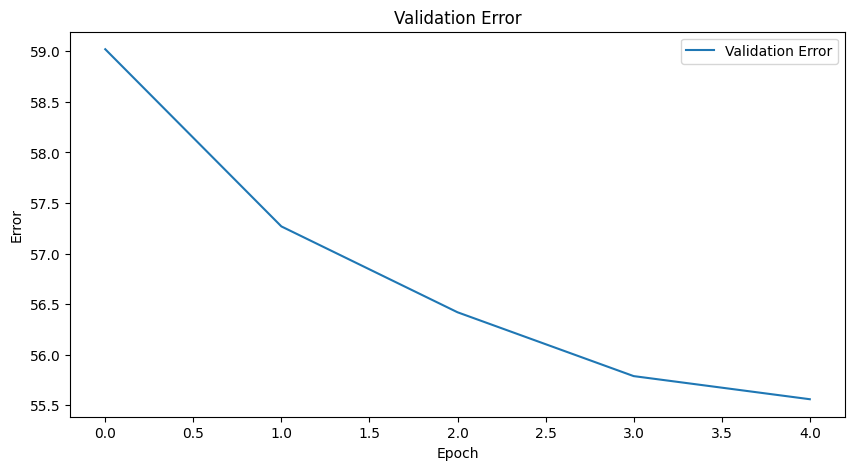

<Figure size 640x480 with 0 Axes>

In [72]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 5, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

In [1]:
model.eval()
val_correct = 0
val_total = 0
validation_loss = 0.0
if val_loader is not None:
    with torch.no_grad():
        val_correct = 0
        val_total = 0
        val_top3_correct = 0
        validation_loss = 0

        for boards, sequences, lengths, fens, labels in val_loader:
            boards, sequences, labels = boards.to(device, non_blocking=True), sequences.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            outputs = model(boards, sequences)
            probabilities = torch.softmax(outputs, dim=1)
            minus = 0
            for idx, (sequence, fen, label) in enumerate(zip(sequences, fens, labels)):
                output = probabilities[idx]
                sorted_probs, sorted_indices = torch.sort(output, descending=True)
                predicted_move = sorted_indices[0]
                # print(predicted_move)
                chess_board = chess.Board(fen)
                for move_idx in sorted_indices:
                    move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')    
                    if is_legal_move(chess_board, move):
                        # print("we found one")
                        predicted_move = vocab.get_id(move)
                        break
                    elif '+' in move and is_legal_move(chess_board, move[:-1] + '#'):
                        predicted_move = vocab.get_id(move)
                        break
                
                # Check if predicted move is correct
                correct_move = label.item() # Convert label to move
                # print(correct_move)
                if predicted_move == correct_move:
                    val_correct += 1
            val_total += (labels.size(0) - minus)
            
        val_accuracy = 100 * val_correct / val_total
        print(val_accuracy)

NameError: name 'model' is not defined

In [77]:
if val_accuracy > 45:
    torch.save(model.state_dict(), 'model_images/multimodal-exp-14.pth')

In [75]:
lr = 2e-5
weight_decay=0
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 1, learn_decay)


Epoch 1, Batch: 1000| Training Loss: 1.748116977453232 | Training Error: 0.4228984375
Epoch 1, Batch: 2000| Training Loss: 1.7400309324264527 | Training Error: 0.422970703125
Epoch 1, Batch: 3000| Training Loss: 1.7398987680276234 | Training Error: 0.42296484375
Epoch 1, Batch: 4000| Training Loss: 1.739231415182352 | Training Error: 0.4227373046875
Epoch 1, Batch: 5000| Training Loss: 1.7368518795251846 | Training Error: 0.42340859375
Epoch 1, Batch: 6000| Training Loss: 1.735506498416265 | Training Error: 0.42384765625
Epoch 1, Batch: 7000| Training Loss: 1.7348424687896455 | Training Error: 0.42380022321428573
Epoch 1, Batch: 8000| Training Loss: 1.7341011367440224 | Training Error: 0.42398095703125
Epoch 1, Batch: 9000| Training Loss: 1.7334420188003117 | Training Error: 0.42400390625
Epoch 1, Batch: 10000| Training Loss: 1.7326563291430472 | Training Error: 0.4239796875
Epoch 1, Batch: 11000| Training Loss: 1.7325636682618748 | Training Error: 0.42400816761363636
Epoch 1, Batch: 1

In [78]:
lr = 3e-5
weight_decay=1e-9
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 5, learn_decay)


Epoch 1, Batch: 1000| Training Loss: 1.7191257472038268 | Training Error: 0.42665625
Epoch 1, Batch: 2000| Training Loss: 1.7177017276287079 | Training Error: 0.426619140625
Epoch 1, Batch: 3000| Training Loss: 1.717012415687243 | Training Error: 0.42669140625
Epoch 1, Batch: 4000| Training Loss: 1.7186419586837292 | Training Error: 0.4263671875
Epoch 1, Batch: 5000| Training Loss: 1.7171806054592134 | Training Error: 0.4267546875
Epoch 1, Batch: 6000| Training Loss: 1.718345610320568 | Training Error: 0.42666861979166665
Epoch 1, Batch: 7000| Training Loss: 1.7184513988324575 | Training Error: 0.4265306919642857
Epoch 1, Batch: 8000| Training Loss: 1.7186902163177729 | Training Error: 0.426541015625
Epoch 1, Batch: 9000| Training Loss: 1.7179350499179629 | Training Error: 0.42664279513888886
Epoch 1, Batch: 10000| Training Loss: 1.7176994973182678 | Training Error: 0.4267015625
Epoch 1, Batch: 11000| Training Loss: 1.718134996175766 | Training Error: 0.42661257102272726
Epoch 1, Batch

## Experiment 15 (continuing the model from exp-14)

In [59]:

        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4,pin_memory=True)


In [58]:
# Initialize model, loss function, and optimizer
d_model = 512
vocab_size = len(vocab.id_to_move.keys())
nhead = 8
num_layers = 4
transformer = ChessTransformer(vocab, d_model, nhead, num_layers = num_layers)
transformer.load_state_dict(torch.load('model_images/seq-transformer-exp-6.pth'))

d_out = len(vocab.id_to_move.keys())
cnn = SENetPureFour(d_out, 96, 512)
cnn.load_state_dict(torch.load('model_images/cnn-exp-10-more.pth'))

# Initialize model, loss function, and optimizer
d_model = 512
NUM_EPOCHS = 2
d_out = len(vocab.id_to_move.keys())
model = MultiModalTen(vocab, d_model, d_out, transformer, cnn) 
model = model.to(device)

# GOLDEN HYPERPARAMETERS FOR BATCH SIZE 128
criterion = nn.CrossEntropyLoss()
lr = 2e-5
weight_decay=1e-9
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

model.load_state_dict(torch.load('model_images/multimodal-exp-14.pth'))



<All keys matched successfully>

In [61]:
model.eval()
val_correct = 0
val_total = 0
validation_loss = 0.0
count = 0
if val_loader is not None:
    with torch.no_grad():
        val_correct = 0
        val_total = 0
        val_top3_correct = 0
        validation_loss = 0

        for boards, sequences, lengths, fens, labels in val_loader:
            count += 1
            boards, sequences, labels = boards.to(device, non_blocking=True), sequences.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            outputs = model(boards, sequences)
            probabilities = torch.softmax(outputs, dim=1)
            for idx, (sequence, fen, label) in enumerate(zip(sequences, fens, labels)):
                output = probabilities[idx]
                sorted_probs, sorted_indices = torch.sort(output, descending=True)
                predicted_move = sorted_indices[0]
                # print(predicted_move)
                chess_board = chess.Board(fen)
                for move_idx in sorted_indices:
                    move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')    
                    if is_legal_move(chess_board, move):
                        # print("we found one")
                        predicted_move = vocab.get_id(move)
                        break
                # Check if predicted move is correct
                correct_move = label.item() # Convert label to move
                # print(correct_move)
                if predicted_move == correct_move:
                    val_correct += 1
                # else: 
                #     print(chess_board)
                #     print(vocab.get_move(predicted_move), '| actual move: ', vocab.get_move(label.item()))
            val_total += (labels.size(0))
        
        val_accuracy = 100 * val_correct / val_total
        print(val_accuracy)

r . . q k . . r
p . . b . p p p
. . p . . n . .
n . b . p . N .
B P . . . . . .
. . P . . . . .
P . . P . P P P
R N B Q K . . R
Bxf2+ | actual move:  O-O
r . . q k . . r
p p p . p p b p
. . n . . . p .
. . . p . b . .
. . . P n . . N
. . N . P . P .
P P P . . P B P
R . B Q . R K .
Nxc3 | actual move:  Qd6
. . k r . . . r
p p . . . p . .
. . . p . . . p
. . . P p p . .
. n . Q . . . .
. . N . . P P .
P P P . . . B P
R . . . . R K .
Qxb4 | actual move:  Qe4
. k . r . . . r
p p . . . R . .
. . . p . . . p
. . . P . . . .
. . . . P . . .
. . . p . . P .
P P . . . . B P
. . . R . . K .
Rhe8 | actual move:  b5
. k . . . r . .
p . . . . . . .
. . . p . . . .
R . . P . . . p
. . . . P . . .
. . . . . . P .
P P . . . . B P
. . . . . . K .
Rb5 | actual move:  Ra6
r n b q k b n r
p p p p p p p p
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
P P P P P P P P
R N B Q K B N R
e4 | actual move:  e3
r . . q k . . r
p p p . . p p p
. . n b . . . .
. . . p . . . .
. . . . n . b .
. . . 

. . . r . . . .
. . . . . . k p
p . . . . p p .
. p p q P . . .
. . P p . P . .
. P . Q . . . P
P . . . . K P .
. . . R . . . .
bxc4 | actual move:  Qc6
. r . . . . . .
. . . . q . k p
. . . . . . p .
. p p . . . . .
. . . p . P . .
. P . Q . . P P
P . . . . K . .
. . R . . . . .
Kf3 | actual move:  Re1
r . b q . r k .
p p p p . p p p
. . n . . n . .
. B b . p . . .
. . . . P . . .
. . . P . N . .
P P P . . P P P
R N B Q . R K .
c3 | actual move:  Nc3
r . b q r . k .
. . p n . p p p
p . p . . . . .
. . . p P . . .
. . . P . . . .
. . N . . N . .
P P P . . . P P
R . . Q . R K .
Qd3 | actual move:  Qd2
r . . . . . k .
. b p . q p p p
p . . . r . . .
. . . p P . . .
. . . . . Q . .
. . N . . . . .
P P P . . . P P
. . . . R R K .
Nxd5 | actual move:  Rd1
. . . . . . k .
. b . r q p p p
p . . . . . . .
. . p . . . . .
N . . p . Q . .
. . . . . . . .
P P P . . R P P
. . . . r R K .
Rxe1 | actual move:  Qb8+
. . . . . . k .
. . . Q . p p p
p . . . . . . .
. . N . . . q .
. . . p . . . .
. . .

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f80c0407760>>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


r . b . . r k .
p p b . . p p p
. . . . . . q .
. . . . n . . .
. . . . B . . .
. . . . . N . P
P P . N . P P .
R . . Q . R . K
f5 | actual move:  Qh6
r n b q k b n r
p p p p . p p p
. . . . . . . .
. . . . p . . .
. . . . P . . .
. . . . . . . .
P P P P . P P P
R N B Q K B N R
Nf3 | actual move:  f4
r n b . k b n r
p p p . . p p p
. . . . q . . .
. . . . . . . .
. . . . . p . .
. . N . . N . .
P P P P B . P P
R . B Q K . . R
Nf6 | actual move:  Bd6
r n b q k b n r
p p p p p p p p
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . . . .
P P P P P P P P
R N B Q K B N R
e4 | actual move:  g4
r n b q k b n r
p p . p . p . p
. . p . p . p .
. . . . . . . .
. . P . . . P .
. . . . P . . .
P P . P . P B P
R N B Q K . N R
Bg7 | actual move:  a6
r n b q k . n r
. p . . . p . p
p . p . p . p .
. . b p . . . .
. . . P . . P .
. . . . P . . P
P P . . . P B .
R N B Q K . N R
Ba7 | actual move:  Be7
r n b q k . . r
. p . . b p . p
p . p . p n p .
. . . p . . . .
. . . P . . P .
. . N . P . .

In [60]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 1, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

Epoch 1, Batch: 1000| Training Loss: 2.122331482887268 | Training Error: 0.4256484375
Epoch 1, Batch: 2000| Training Loss: 2.1186527816653253 | Training Error: 0.42775
Epoch 1, Batch: 3000| Training Loss: 2.119037294348081 | Training Error: 0.42716666666666664
Epoch 1, Batch: 4000| Training Loss: 2.1205012532770633 | Training Error: 0.427138671875
Epoch 1, Batch: 5000| Training Loss: 2.1198365435838697 | Training Error: 0.4276765625
Epoch 1, Batch: 6000| Training Loss: 2.120417678833008 | Training Error: 0.42789192708333335
Epoch 1, Batch: 7000| Training Loss: 2.1211196623700004 | Training Error: 0.42765959821428573
Epoch 1, Batch: 8000| Training Loss: 2.1194574618190525 | Training Error: 0.4281787109375
Epoch 1, Batch: 9000| Training Loss: 2.1186364214022952 | Training Error: 0.4283046875
Epoch 1, Batch: 10000| Training Loss: 2.1181883453845978 | Training Error: 0.428284375
Epoch 1, Batch: 11000| Training Loss: 2.1180820040919563 | Training Error: 0.42846875
Epoch 1, Batch: 12000| Tra

KeyboardInterrupt: 

In [49]:
torch.save(model.state_dict(), 'model_images/multimodal-exp-15.pth')

## Experiment 16 (training from Scratch...)

In [7]:

        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 256
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=5, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=5,pin_memory=True)


# Initialize model, loss function, and optimizer
d_model = 512
vocab_size = len(vocab.id_to_move.keys())
nhead = 8
num_layers = 4
# transformer = ChessTransformer(vocab, d_model, nhead, num_layers = num_layers)
# transformer.load_state_dict(torch.load('model_images/seq-transformer-exp-6.pth'))

d_out = len(vocab.id_to_move.keys())
# cnn = SENetPureFour(d_out, 96, 512)
# cnn.load_state_dict(torch.load('model_images/cnn-exp-10-more.pth'))

# Initialize model, loss function, and optimizer
d_model = 512
NUM_EPOCHS = 2
d_out = len(vocab.id_to_move.keys())
model = MultiModalTen(vocab, d_model, d_out, dropout = 0.2) 
model = model.to(device)

criterion = nn.CrossEntropyLoss()
lr = 2e-4
weight_decay=1e-9
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


Epoch 1, Batch: 1000| Training Loss: 5.064397220611572 | Training Error: 0.126125
Epoch 1, Batch: 2000| Training Loss: 4.6034379036426545 | Training Error: 0.166560546875
Epoch 1, Batch: 3000| Training Loss: 4.3266192684173586 | Training Error: 0.18961848958333333
Epoch 1, Batch: 4000| Training Loss: 4.129903744161129 | Training Error: 0.2057314453125
Epoch 1, Batch: 5000| Training Loss: 3.98051447019577 | Training Error: 0.21796796875
Epoch 1, Batch: 6000| Training Loss: 3.861451952854792 | Training Error: 0.22788606770833333
Epoch 1, Batch: 7000| Training Loss: 3.763567283289773 | Training Error: 0.2360825892857143
Epoch 1, Batch: 8000| Training Loss: 3.679715732604265 | Training Error: 0.24334912109375
Epoch 1, Batch: 9000| Training Loss: 3.6088190910551283 | Training Error: 0.24944618055555556
Epoch 1, Batch: 10000| Training Loss: 3.546396715760231 | Training Error: 0.254905078125
Epoch 1, Batch: 11000| Training Loss: 3.4904959817582912 | Training Error: 0.25996058238636366
Epoch 1

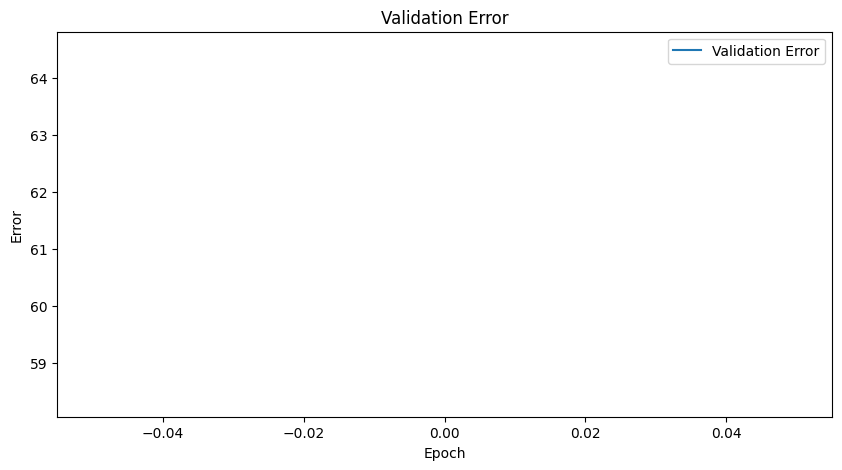

<Figure size 640x480 with 0 Axes>

In [8]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 1, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

Epoch 1, Batch: 1000| Training Loss: 2.4185839507579803 | Training Error: 0.3728828125
Epoch 1, Batch: 2000| Training Loss: 2.407119723200798 | Training Error: 0.374173828125
Epoch 1, Batch: 3000| Training Loss: 2.3984647359053293 | Training Error: 0.37521354166666665
Epoch 1, Batch: 4000| Training Loss: 2.389903884917498 | Training Error: 0.3759365234375
Epoch 1, Batch: 5000| Training Loss: 2.383360452079773 | Training Error: 0.3769296875
Epoch 1, Batch: 6000| Training Loss: 2.378622715175152 | Training Error: 0.37755078125
Epoch 1, Batch: 7000| Training Loss: 2.3746364192792346 | Training Error: 0.37789453125
Epoch 1, Batch: 8000| Training Loss: 2.3694963825643063 | Training Error: 0.37853369140625
Epoch 1, Batch: 9000| Training Loss: 2.366085472504298 | Training Error: 0.37876953125
Epoch 1, Batch: 10000| Training Loss: 2.362054225337505 | Training Error: 0.37926796875
Epoch 1, Batch: 11000| Training Loss: 2.3578435174335133 | Training Error: 0.3798824573863636
Epoch 1, Batch: 12000

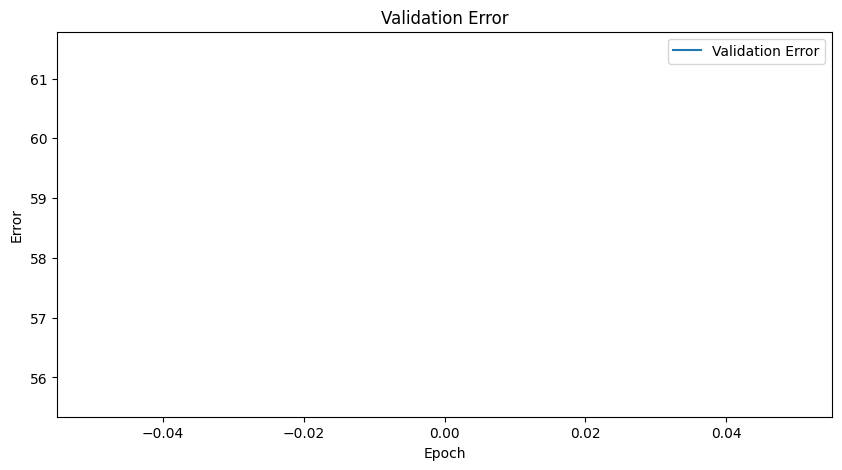

<Figure size 640x480 with 0 Axes>

In [9]:
criterion = nn.CrossEntropyLoss()
lr = 1e-4
weight_decay=1e-9
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 1, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

In [10]:
torch.save(model.state_dict(), 'model_images/multimodal-exp-16-checkpoint-2.pth')

In [14]:
model.eval()
val_correct = 0
val_total = 0
validation_loss = 0.0
count = 0
if val_loader is not None:
    with torch.no_grad():
        val_correct = 0
        val_total = 0
        val_top3_correct = 0
        validation_loss = 0
        for boards, sequences, lengths, fens, labels in val_loader:
            count += 1
            minus = 0
            boards, sequences, labels = boards.to(device, non_blocking=True), sequences.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            outputs = model(boards, sequences)
            probabilities = torch.softmax(outputs, dim=1)
            for idx, (sequence, fen, length, label) in enumerate(zip(sequences, fens, lengths, labels)):
                # if length > 10:
                    output = probabilities[idx]
                    sorted_probs, sorted_indices = torch.sort(output, descending=True)
                    predicted_move = sorted_indices[0]
                    # print(predicted_move)
                    chess_board = chess.Board(fen)
                    for move_idx in sorted_indices:
                        move = vocab.get_move(move_idx.item()) # Convert index to move (e.g., 'e2e4')    
                        if is_legal_move(chess_board, move):
                            # print("we found one")
                            predicted_move = vocab.get_id(move)
                            break
                    # Check if predicted move is correct
                    correct_move = label.item() # Convert label to move
                    # print(correct_move)
                    if predicted_move == correct_move:
                        val_correct += 1
                    # else: 
                    #     print(chess_board)
                    #     print(vocab.get_move(predicted_move), '| actual move: ', vocab.get_move(label.item()))
                # else: 
                #     minus += 1
            val_total += (labels.size(0) - minus)
        
        val_accuracy = 100 * val_correct / val_total
        print(val_accuracy)

42.32861806311208


In [18]:
model.load_state_dict(torch.load('model_images/multimodal-exp-16-checkpoint-2.pth'))

<All keys matched successfully>

Epoch 1, Batch: 1000| Training Loss: 2.2095202668905256 | Training Error: 0.40181640625
Epoch 1, Batch: 2000| Training Loss: 2.2091538038253784 | Training Error: 0.40093359375
Epoch 1, Batch: 3000| Training Loss: 2.20580405942599 | Training Error: 0.4018567708333333
Epoch 1, Batch: 4000| Training Loss: 2.2020761277377607 | Training Error: 0.40228515625
Epoch 1, Batch: 5000| Training Loss: 2.199278408908844 | Training Error: 0.40262578125
Epoch 1, Batch: 6000| Training Loss: 2.197186432202657 | Training Error: 0.4030989583333333
Epoch 1, Batch: 7000| Training Loss: 2.195673640898296 | Training Error: 0.40325502232142857
Epoch 1, Batch: 8000| Training Loss: 2.1935819251686333 | Training Error: 0.4035986328125
Epoch 1, Batch: 9000| Training Loss: 2.1928331263595155 | Training Error: 0.4035594618055556
Epoch 1, Batch: 10000| Training Loss: 2.19093603566885 | Training Error: 0.40385703125
Epoch 1, Batch: 11000| Training Loss: 2.1887673045180063 | Training Error: 0.40415625
Epoch 1, Batch: 1

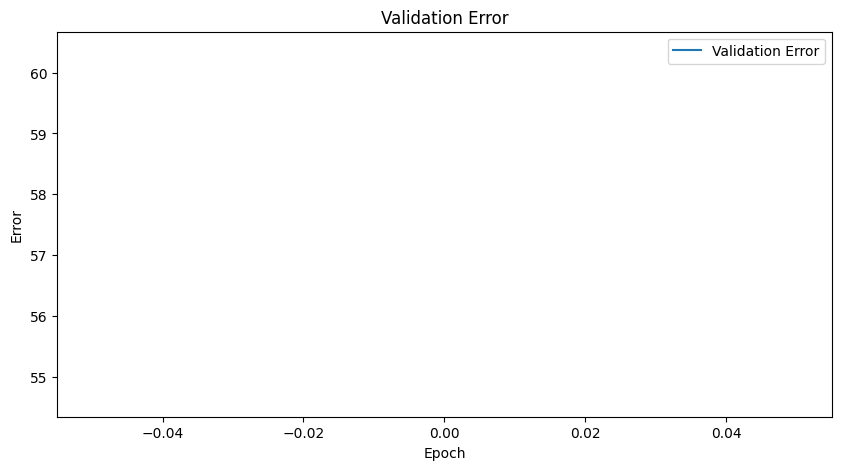

<Figure size 640x480 with 0 Axes>

In [19]:
criterion = nn.CrossEntropyLoss()
lr = 5e-5 # much better than 1.5e-4
weight_decay=1e-10
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 1, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

In [20]:
torch.save(model.state_dict(), 'model_images/multimodal-exp-16-checkpoint-3.pth')

Epoch 1, Batch: 1000| Training Loss: 2.10219173848629 | Training Error: 0.418416015625
Epoch 1, Batch: 2000| Training Loss: 2.0996543085575103 | Training Error: 0.418765625
Epoch 1, Batch: 3000| Training Loss: 2.0979930860598883 | Training Error: 0.41898372395833333
Epoch 1, Batch: 4000| Training Loss: 2.098191953897476 | Training Error: 0.4187763671875
Epoch 1, Batch: 5000| Training Loss: 2.0979504269599913 | Training Error: 0.418688671875
Epoch 1, Batch: 6000| Training Loss: 2.0979439326723415 | Training Error: 0.4186197916666667
Epoch 1, Batch: 7000| Training Loss: 2.097657677565302 | Training Error: 0.41872907366071427
Epoch 1, Batch: 8000| Training Loss: 2.097493914112449 | Training Error: 0.4187421875
Epoch 1, Batch: 9000| Training Loss: 2.097277520974477 | Training Error: 0.41874327256944444
Epoch 1, Batch: 10000| Training Loss: 2.0968572966337202 | Training Error: 0.4188048828125
Epoch 1, Batch: 11000| Training Loss: 2.0966460636962543 | Training Error: 0.418892578125
Epoch 1, 

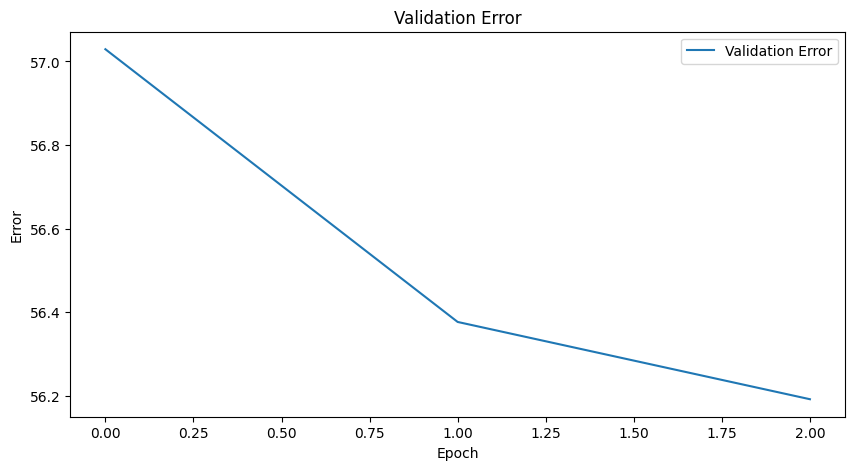

<Figure size 640x480 with 0 Axes>

In [21]:
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 512
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=5, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=5,pin_memory=True)

criterion = nn.CrossEntropyLoss()
lr = 4e-5 
weight_decay=1e-11
learn_decay = 0.5 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 3, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

In [22]:
torch.save(model.state_dict(), 'model_images/multimodal-exp-16-checkpoint-4-6.pth')

Epoch 1, Batch: 1000| Training Loss: 1.6457591900825501 | Training Error: 0.427654296875
Epoch 1, Batch: 2000| Training Loss: 1.6428084093928337 | Training Error: 0.4279423828125
Epoch 1, Batch: 3000| Training Loss: 1.6419909894069036 | Training Error: 0.427560546875
Epoch 1, Batch: 4000| Training Loss: 1.6424991807043552 | Training Error: 0.427056640625
Epoch 1, Batch: 5000| Training Loss: 1.6427715931892395 | Training Error: 0.42698828125
Epoch 1, Batch: 6000| Training Loss: 1.6423907393018404 | Training Error: 0.4268173828125
Epoch 1, Batch: 7000| Training Loss: 1.6425841547250748 | Training Error: 0.4266598772321429
Epoch 1, Batch: 8000| Training Loss: 1.6427940555214882 | Training Error: 0.4264794921875
Epoch 1, Batch: 9000| Training Loss: 1.6430340327421824 | Training Error: 0.426357421875
Epoch 1, Batch: 10000| Training Loss: 1.6433259852409363 | Training Error: 0.426221484375
Epoch 1, Batch: 11000| Training Loss: 1.6430582829280334 | Training Error: 0.4260926846590909
Epoch 1, 

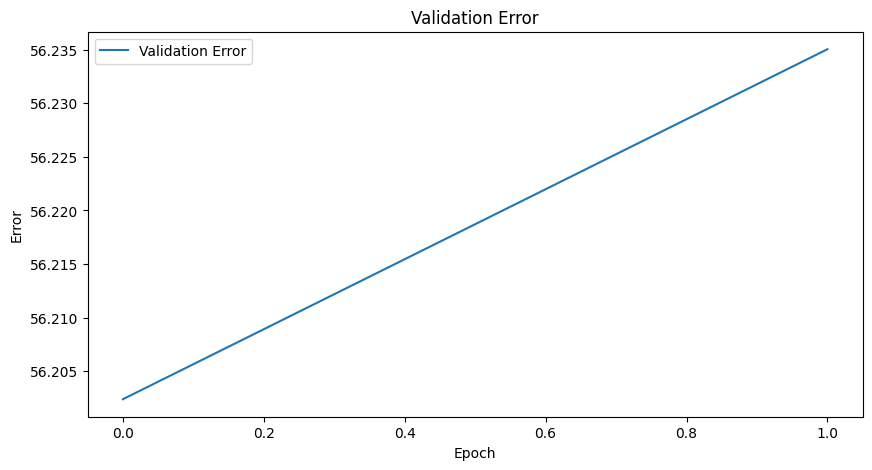

<Figure size 640x480 with 0 Axes>

In [23]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 512
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=5, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=5,pin_memory=True)

criterion = FocalLoss()
lr = 1e-5 
weight_decay=1e-11
learn_decay = 0.5 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 2, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

In [24]:
torch.save(model.state_dict(), 'model_images/multimodal-exp-16-checkpoint-7-8.pth')

## Experiment 16.5

can we memorize the data?? -> yes it can (deleted the cells)

let's try starting from checkpoint 4-6 again.

In [37]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=1, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha  # alpha can be set to a constant, or it can be a tensor of shape (num_classes,)
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)  # Prevents nans when probability 0
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return torch.mean(F_loss)
        elif self.reduction == 'sum':
            return torch.sum(F_loss)
        else:
            return F_loss
        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 256
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=5, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=5,pin_memory=True)


# Initialize model, loss function, and optimizer
d_model = 512
vocab_size = len(vocab.id_to_move.keys())
nhead = 8
num_layers = 4
# transformer = ChessTransformer(vocab, d_model, nhead, num_layers = num_layers)
# transformer.load_state_dict(torch.load('model_images/seq-transformer-exp-6.pth'))

d_out = len(vocab.id_to_move.keys())
# cnn = SENetPureFour(d_out, 96, 512)
# cnn.load_state_dict(torch.load('model_images/cnn-exp-10-more.pth'))

# Initialize model, loss function, and optimizer
d_model = 512
NUM_EPOCHS = 2
d_out = len(vocab.id_to_move.keys())
model = MultiModalTen(vocab, d_model, d_out, dropout = 0.2) 
model = model.to(device)

criterion = nn.CrossEntropyLoss()
lr = 2e-4
weight_decay=1e-9
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

count_parameters(model)

46598580

Epoch 1, Batch: 100| Training Loss: 6.20823118686676 | Training Error: 0.0516796875
Epoch 1, Batch: 200| Training Loss: 5.832723252773285 | Training Error: 0.069296875
Epoch 1, Batch: 300| Training Loss: 5.651141436894735 | Training Error: 0.08033854166666667
Epoch 1, Batch: 400| Training Loss: 5.515767470598221 | Training Error: 0.089619140625
Epoch 1, Batch: 500| Training Loss: 5.423870465278625 | Training Error: 0.0966484375
Epoch 1, Batch: 600| Training Loss: 5.339358932177226 | Training Error: 0.10302083333333334
Epoch 1, Batch: 700| Training Loss: 5.262390960284642 | Training Error: 0.1092578125
Epoch 1, Batch: 800| Training Loss: 5.194943644404411 | Training Error: 0.114814453125
Epoch 1, Batch: 900| Training Loss: 5.128941990004646 | Training Error: 0.12090711805555555
Epoch 1, Batch: 1000| Training Loss: 5.067179068088532 | Training Error: 0.12639453125
Epoch 1, Batch: 1100| Training Loss: 5.013474265445362 | Training Error: 0.1308203125
Epoch 1, Batch: 1200| Training Loss: 4.

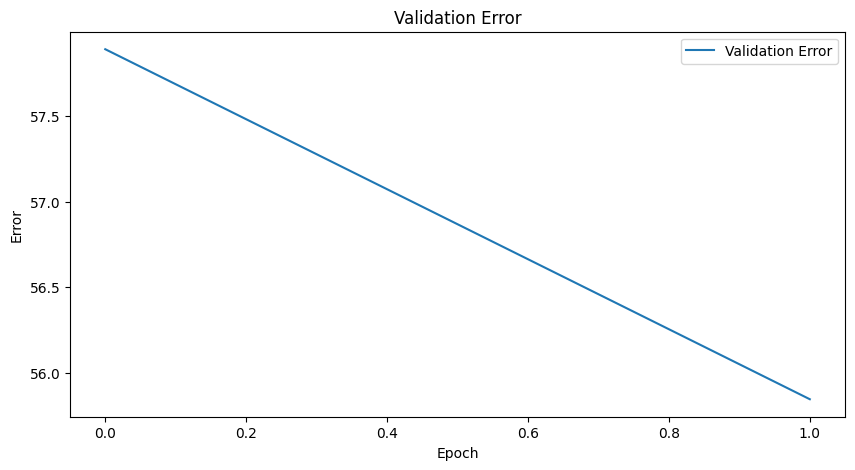

<Figure size 640x480 with 0 Axes>

In [38]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 2, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

In [39]:
torch.save(model.state_dict(), 'model_images/multimodal-exp-16.5-checkpoint-2.pth')

In [42]:
criterion = nn.CrossEntropyLoss()
lr = 1e-4
weight_decay=1e-9
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

In [43]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 2, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

Epoch 1, Batch: 1000| Training Loss: 1.9812144792079927 | Training Error: 0.4352109375
Epoch 1, Batch: 2000| Training Loss: 1.9808792276382445 | Training Error: 0.435197265625
Epoch 1, Batch: 3000| Training Loss: 1.9772565033833185 | Training Error: 0.4359544270833333
Epoch 1, Batch: 4000| Training Loss: 1.976125215113163 | Training Error: 0.4362431640625
Epoch 1, Batch: 5000| Training Loss: 1.9760406699419022 | Training Error: 0.4364390625
Epoch 1, Batch: 6000| Training Loss: 1.9757205544511478 | Training Error: 0.43631184895833336
Epoch 1, Batch: 7000| Training Loss: 1.97412444291796 | Training Error: 0.43653683035714286
Epoch 1, Batch: 8000| Training Loss: 1.9745471029132604 | Training Error: 0.43648974609375
Epoch 1, Batch: 9000| Training Loss: 1.9742188656992383 | Training Error: 0.4365920138888889
Epoch 1, Batch: 10000| Training Loss: 1.973171236360073 | Training Error: 0.436780859375
Epoch 1, Batch: 11000| Training Loss: 1.9730613347833807 | Training Error: 0.43686576704545454
E

In [ ]:
torch.save(model.state_dict(), 'model_images/multimodal-exp-16.5-checkpoint-3-4.pth')

In [ ]:
criterion = nn.CrossEntropyLoss()
lr = 1e-5
weight_decay=1e-10
learn_decay = 0.8 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_for_multi_transformer(device, model, train_loader, val_loader, criterion, optimizer, 2, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

## Experiment 17 (batch sizes)

Experiment 18

In [58]:

        
# Reload the data with particular batch size
torch.multiprocessing.set_start_method('fork', force=True)
batch_size = 512
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4,pin_memory=True)


# Initialize model, loss function, and optimizer
d_model = 512
NUM_EPOCHS = 2
d_out = len(vocab.id_to_move.keys())
model = MultiModalTwelve(vocab, d_model, d_model, d_out, dropout = 0.2) 
model = model.to(device)

criterion = nn.CrossEntropyLoss()
lr = 2e-4
weight_decay=1e-7
learn_decay = 0.6 # 
optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

count_parameters(model)


35309876

In [59]:
# Train the model
train_error,train_loss_values, val_error, val_loss_value = train_with_fen(device, model, train_loader, val_loader, criterion, optimizer, 1, learn_decay)

# Plot the training error
plt.figure(figsize=(10, 5))
plt.plot(val_error, label='Validation Error')
plt.xlabel('Epoch')
plt.ylabel('Error')
plt.title('Validation Error')
plt.legend()
plt.show()
plt.savefig('multi-modal-4-26.png')  # This will save the plot as an image

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fe3b8743520>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1479, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1462, in _shutdown_workers
    if w.is_alive():
  File "/opt/conda/envs/pytorch/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fe3b8743520>
Traceback (most recent call last):
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1479, in __del__
    self._shutdown_workers()
  File "/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/utils/data/dataloader.py",

Epoch 1, Batch: 1000| Training Loss: 4.782170153617859
